# 1. Investigate IDPs

In [5]:
!pwd

/Users/aroibu_admin/Desktop/agemapper/Analsysis Female New


In [2]:
import numpy as np
from numpy.linalg import inv

import pandas as pd
import h5py
import matplotlib.pyplot as plt
import seaborn as sns
sns.set()
from scipy import linalg
from scipy.stats import pearsonr
from scipy.stats import gaussian_kde
from scipy.stats import t as student_t
from sklearn.linear_model import LinearRegression, ElasticNetCV
from statsmodels.stats import multitest as mt
import argparse
from sklearn.model_selection import KFold

import sys

In [4]:
def scatter_plot(x, y, xlabel, ylabel, title):
    g = sns.JointGrid()
    sns.scatterplot(x=x, y=y, ax=g.ax_joint) # can set s=10
    sns.kdeplot(x=x, linewidth=2, ax=g.ax_marg_x) 
    sns.kdeplot(y=y, linewidth=2, ax=g.ax_marg_y)

    g.ax_joint.set(xlabel=xlabel, ylabel=ylabel)

    g.ax_joint.plot([np.min(x), np.max(x)], [np.min(x), np.max(x)], linewidth=1.0, color='black', linestyle='solid', label='Equality Line')

    X_mat=np.vstack((np.ones(len(x)), x)).T
    beta_hat = np.linalg.inv(X_mat.T.dot(X_mat)).dot(X_mat.T).dot(y)
    b,w = beta_hat[0],beta_hat[1]
    x2 = np.linspace(np.min(x),np.max(x),num=10)
    y2 = w * x2 + b

    g.ax_joint.plot(x2, y2, 'r--', linewidth=3.0, label='Linear Regression Line')
    g.ax_joint.legend()
    
    pearson_correlation = pearsonr(x,y)[0]

    g.ax_joint.text(np.max(x), np.min(y)+0.05*np.abs(np.min(y2)), 'R='+str(round(pearson_correlation,3)), horizontalalignment='right', fontsize='large')
    print("Reg Slope:", w)

    g.fig.suptitle(title, y=1.05)

    plt.show()

   
    
def get_corr_plot(array, title, labels, partial_correlation=False, fig_size=None, fix_colorbar_scale=False,
                 title_font_size = None,
                    ticks_font_size = None,
                    legend_font = None,
                  save_fig_title=None,
                 ):
    with sns.axes_style("white"):
        if fig_size == None:
            fig = plt.figure() # can set figsize=(fig_size = 12.8, fig_size)
        else:
            fig = plt.figure(figsize=fig_size)
        ax = fig.add_subplot(111)
        if fix_colorbar_scale == True:
            cax = ax.matshow(array, interpolation='nearest',cmap='viridis', vmin=0, vmax=1)
        else:
            cax = ax.matshow(array, interpolation='nearest',cmap='viridis')
        cbar = fig.colorbar(cax)
        cbar.ax.tick_params(labelsize=ticks_font_size)
        if partial_correlation == False:
            intro = "Correlation (r)"
        else:
            intro = "Partial Correlation"
        plt.title("{} for {}".format(intro, title), fontsize=title_font_size if fig_size != None else 10)
        ax.set_yticks(np.arange(len(labels)), fontsize= ticks_font_size)
        ax.set_yticklabels(labels, fontsize= ticks_font_size)
        ax.xaxis.set_ticks_position("bottom")
        ax.set_xticks(np.arange(len(labels)), fontsize= ticks_font_size)
        ax.set_xticklabels(labels, rotation=90, fontsize= ticks_font_size)

        if save_fig_title is not None:
            plt.savefig(save_fig_title,bbox_inches='tight')
            
        plt.show()

def correlation_plot(df, key, title, partial_correlation= False, fig_size=None, fix_colorbar_scale=False):
    
    names = df.modality.to_list()
    
    if partial_correlation == False:
        corr_df1 = []
        for idx1 in range(len(df)):
            df1 = df.iloc[idx1].dataframe
            corr_df2 = []
            for idx2 in range(len(df)):
                df2 = df.iloc[idx2].dataframe
                
                dfm = pd.merge(df1, df2, on='Unnamed: 0', how='inner')
                keyX = key + '_x'
                keyY = key + '_y'
                
                r, _ = pearsonr(dfm[keyX], dfm[keyY])
                corr_df2.append(r)
            corr_df2 = np.array(corr_df2).astype('float32')
            corr_df1.append(corr_df2)
        corr_df1 = np.array(corr_df1).astype('float32')
        get_corr_plot(corr_df1, labels=names, partial_correlation=partial_correlation,
                      title=title, fig_size=fig_size, fix_colorbar_scale=fix_colorbar_scale) 
    else:
        tmp_dct = {}
        for idx in range(len(df)):
#             tmp_df = df.iloc[idx].dataframe[key]
            tmp_df = pd.merge(df.iloc[0].dataframe, df.iloc[idx].dataframe, on='Unnamed: 0', how='inner')
            keyY = key + '_y'
            tmp_df = tmp_df[keyY]
            tmp_dct[names[idx]] = tmp_df.to_numpy()
        pcorr_df = pd.DataFrame.from_dict(tmp_dct)
        del tmp_dct, tmp_df
        
        # This implementation comes from https://pingouin-stats.org/index.html
        # Source code here for pcorr: https://github.com/raphaelvallat/pingouin/blob/72e447d539f8cfbd6b9c9c5041e267de748fe124/pingouin/correlation.py

        V = pcorr_df.cov()
        Vi = np.linalg.pinv(V, hermitian=True)
        D = np.diag(np.sqrt(1 / np.diag(Vi)))
        pcor = -1 * (D @ Vi @ D)
        pcor[np.diag_indices_from(pcor)] = 1
        get_corr_plot(pcor, labels=names, partial_correlation=partial_correlation,
                      title=title, fig_size=fig_size, fix_colorbar_scale=fix_colorbar_scale)   
    

def correlation_plot_fig(df, key, title, partial_correlation= False, fix_colorbar_scale=False,
                    use_B_testset = False, modality_names=None,
                    title_font_size = None,
                    ticks_font_size = None,
                    legend_font = None,
                    figsize = None,
                        deconfound=False,
                     save_fig_title=None,
                    ):    
    
    
    names = modality_names
    fig_size = figsize
    
    if partial_correlation == False:
        
        corr_df1 = []
        for idx1 in range(len(df)):
            df1 = df.iloc[idx1].dataframe
            corr_df2 = []
            for idx2 in range(len(df)):
                df2 = df.iloc[idx2].dataframe
                
                dfm = pd.merge(df1, df2, on='Unnamed: 0', how='inner')
                keyX = key + '_x'
                keyY = key + '_y'
                
                if deconfound == True:
                    counfoundsMerged = None
                    elimSubj = list(set(df1['Unnamed: 0']) - set(df2['Unnamed: 0']))
                    idx_elim = np.intersect1d(df1['Unnamed: 0'], elimSubj, return_indices=True)[1]
                    counfoundsMerged = np.delete(confounds, idx_elim, axis=0)
                    dfm[keyX] = deconfound_inputs(dfm[keyX], counfoundsMerged)
                    dfm[keyY] = deconfound_inputs(dfm[keyY], counfoundsMerged)
                    r, _ = pearsonr(dfm[keyX], dfm[keyY])
                else:
                    r, _ = pearsonr(dfm[keyX], dfm[keyY])
                
                corr_df2.append(r)
            corr_df2 = np.array(corr_df2).astype('float32')
            corr_df1.append(corr_df2)
        corr_df1 = np.array(corr_df1).astype('float32')
        
        get_corr_plot(corr_df1, labels=names, partial_correlation=partial_correlation,
                      title=title, fig_size=fig_size, fix_colorbar_scale=fix_colorbar_scale,
                     title_font_size = title_font_size,
                    ticks_font_size = ticks_font_size,
                    legend_font = legend_font,
                      save_fig_title=save_fig_title
                     )
        
    else:
        tmp_dct = {}
        if deconfound_flag == True:
            
            for idx in range(len(df)):
                df1 = df.iloc[idx].dataframe
                if idx == 0:
                    listOfCommonSubjects = df1['Unnamed: 0'].to_numpy()
                else:
                    if len(listOfCommonSubjects) > df1['Unnamed: 0'].to_numpy().shape[0]:
                        listOfCommonSubjects = df1['Unnamed: 0'].to_numpy()
                        
                        
            
            
            
            
            computation_matrix = []
            for idx in range(len(df)):
                df1 = df.iloc[idx].dataframe
                subjects1 = df1['Unnamed: 0'].to_numpy()
                data1 = df1[key].to_numpy()
                _, data1 = align_subjects(subjects1, subjects_h5, data1, subjects_to_be_ignored)
                computation_matrix.append(data1.tolist())    
            computation_matrix = np.array(computation_matrix).T
            computation_matrix = deconfound_inputs(computation_matrix)
            
            if use_B_testset == True:
                print(computation_matrix.shape)
                _, computation_matrix = train_test_split(computation_matrix, test_size=0.5, random_state=1)
                print(computation_matrix.shape)
            
            title = title + ' and Deconfounded'
            for idx in range(computation_matrix.shape[1]):
                tmp_dct[names[idx]] = computation_matrix[:, idx]
            pcorr_df = pd.DataFrame.from_dict(tmp_dct)
            del tmp_dct
        else:
            for idx in range(len(df)):
#                 tmp_df = df.iloc[idx].dataframe[key]
                tmp_df = pd.merge(df.iloc[0].dataframe, df.iloc[idx].dataframe, on='Unnamed: 0', how='inner')
                keyY = key + '_y'
                tmp_df = tmp_df[keyY]
                tmp_dct[names[idx]] = tmp_df.to_numpy()
            pcorr_df = pd.DataFrame.from_dict(tmp_dct)
            del tmp_dct, tmp_df
        
        
        
        
        for idx in range(len(df)):
#             tmp_df = df.iloc[idx].dataframe[key]
            tmp_df = pd.merge(df.iloc[0].dataframe, df.iloc[idx].dataframe, on='Unnamed: 0', how='inner')
            keyY = key + '_y'
            tmp_df = tmp_df[keyY]
            tmp_dct[names[idx]] = tmp_df.to_numpy()
        pcorr_df = pd.DataFrame.from_dict(tmp_dct)
        del tmp_dct, tmp_df
        
        # This implementation comes from https://pingouin-stats.org/index.html
        # Source code here for pcorr: https://github.com/raphaelvallat/pingouin/blob/72e447d539f8cfbd6b9c9c5041e267de748fe124/pingouin/correlation.py

        V = pcorr_df.cov()
        Vi = np.linalg.pinv(V, hermitian=True)
        D = np.diag(np.sqrt(1 / np.diag(Vi)))
        pcor = -1 * (D @ Vi @ D)
        pcor[np.diag_indices_from(pcor)] = 1
        get_corr_plot(pcor, labels=names, partial_correlation=partial_correlation,
                      title=title, fig_size=fig_size, fix_colorbar_scale=fix_colorbar_scale,
                     title_font_size = title_font_size,
                    ticks_font_size = ticks_font_size,
                    legend_font = legend_font,
                      save_fig_title= save_fig_title,
                     )
    
    
def scatter_plot_heatmap(x, y, xlabel, ylabel, title, equality_line=True, set_scale=False):
    
    if isinstance(x, pd.Series):
        x = x.to_numpy()
    
    if isinstance(y, pd.Series):
        y = y.to_numpy()
    
    fig = plt.figure(figsize=[7.2, 7.2])
    sns.set_style("darkgrid", {'image.cmap': u'plasma'})
    xy = np.vstack([x,y])
    z = gaussian_kde(xy)(xy)
    # Sort the points by density, so that the densest points are plotted last
    idx = z.argsort()
    x, y, z = x[idx], y[idx], z[idx]
    plt.scatter(x,y,c=z,s=50)
    if equality_line == True:
        plt.plot(x, x, ls="-", color = sns.xkcd_rgb['black'], label='Equality Line') #this is just the line of equality
    
    X_mat=np.vstack((np.ones(len(x)), x)).T
    beta_hat = np.linalg.inv(X_mat.T.dot(X_mat)).dot(X_mat.T).dot(y)
    b,w = beta_hat[0],beta_hat[1]
    x2 = np.linspace(np.min(x),np.max(x),num=10)
    y2 = w * x2 + b
    plt.plot(x2,y2,ls='--', color= sns.xkcd_rgb['red'], label='Linear Regression Line')
    
    pearson_correlation = pearsonr(x,y)[0]
    
    if set_scale == True:
        x_min, x_max = np.min(x), np.max(x)
        y_min, y_max = np.min(y), np.max(y)
        c_min, c_max = min(x_min, y_min), max(x_max, y_max)
        plt.xlim([c_min-2, c_max+2])
        plt.ylim([c_min-2, c_max+2])
    
    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    
    lbl = 'Pearson R = '+str(round(pearson_correlation,3))
    plt.plot([],[],' ',label=lbl)
    
    plt.title(title)
    plt.legend()
    plt.show()
    
def kde_plot(x, y, xlabel, ylabel, title):
    plt.figure()
    sns.kdeplot(x, label='Ground Truth')
    sns.kdeplot(y, label= ylabel)
    plt.legend()
    plt.title(title)
    
def age_deconfounding(predicted_ages, chronological_ages):
    
    if isinstance(predicted_ages, pd.Series):
        predicted_ages = predicted_ages.to_numpy()
    
    if isinstance(chronological_ages, pd.Series):
        chronological_ages = chronological_ages.to_numpy()
    
    ones = np.ones(len(chronological_ages))
    chronological_ages_squared = np.square(chronological_ages)
    chronological_ages_confounds = np.array([ones, chronological_ages])
    
    ones_predicted = np.ones(len(predicted_ages))
    predicted_ages_squared = np.square(predicted_ages)
    predicted_ages_confounds = np.array([ones_predicted, predicted_ages])
    
    predicted_ages = np.reshape(predicted_ages, (len(predicted_ages), 1) )
    beta = np.dot( np.linalg.pinv(chronological_ages_confounds.T), predicted_ages )

    corrected_predicted_ages = (predicted_ages.flatten() - beta[0])/beta[1]
    
    return corrected_predicted_ages

def deconfound_inputs(y, idx_nans):
    
    confounds_subset = np.delete(confounds, obj = idx_nans, axis=0)
    
    y = y - y.mean(axis=0)
    if np.sum(np.isnan(y)) == 0:
        beta = np.linalg.pinv(confounds_subset).dot(y)
        beta[np.abs(beta) < 1e-10] = 0
        yd = y - confounds_subset.dot(beta)
        yd = yd - yd.mean()
    else:
        print('ERROR! Encoundered a NaN! Function Needs Updating!')
    
    return yd

def apply_FDR_correction(p_values):
    '''
    Code addapted from Emma Bluemke & Nicola Dinsdale
    Wrapper for Benjamini/Hochberg (non-negative) p-value correction for multiple tests.
    '''
    p_values_corrected = mt.multipletests(p_values, alpha=0.05, method='fdr_bh')[1] 
    
    return p_values_corrected


def standardize_data(variables):
    '''
    Code addapted from Emma Bluemke & Nicola Dinsdale
    '''

    number_of_subjects=variables.shape[0]

    # Compute the arithmetic mean & std along the specified axis, ignoring NaNs.
    variables_mean_ignore_NaNs = np.nanmean(variables,axis=0)
    variables_std_ignore_NaNs = np.nanstd(variables,axis=0)

    # We standardize the data
    variables_scaled = variables - np.tile(variables_mean_ignore_NaNs,(number_of_subjects,1))
    variables_scaled = variables_scaled / np.tile(variables_std_ignore_NaNs,(number_of_subjects,1))

    # Calculate how many variables are non NaN
    number_of_non_NaN =np.sum(np.isnan(variables)==False,axis=0) #np.nanstd has N**0.5 in divisor

    return variables_scaled, number_of_non_NaN


def correlate_with_fdr_correction(deltas, ukb_variables):
    """
    Code addapted from Emma Bluemke & Nicola Dinsdale

    correlate age deltas with rows in ukb_variables
    returns pearson_r, t_test_statistic, p_values_corrected, p_values of length number_of_variables

    pearson_r = raw Pearson correlation value (between -1 and 1)
    t_test_statistic t test statistic for each variable ()
    p_values_corrected is corrected p-values values (fdr corrected)
    p_values is non corrected p-values
    """

    ukb_variables_scaled , ukb_variales_number_of_non_NaN = standardize_data(ukb_variables)
    ukb_variables_NaN_matrix = np.isnan(ukb_variables_scaled)
    ukb_variables_scaled[ukb_variables_NaN_matrix] = 0

    sys.stdout.flush()

    number_of_variables = ukb_variables_scaled.shape[1]

    deltas_array = np.tile(deltas,(number_of_variables,1)).T
    deltas_array[ukb_variables_NaN_matrix] = np.nan
    deltas_array = standardize_data(deltas_array)[0]
    deltas_array[ukb_variables_NaN_matrix] = 0

    pearson_r = np.sum(deltas_array * ukb_variables_scaled, axis=0) / ukb_variales_number_of_non_NaN
    
    t_test_statistic = pearson_r * ((ukb_variales_number_of_non_NaN-2)/(1-pearson_r**2))**0.5
    t_test_statistic = np.abs(t_test_statistic)
    t_test_statistic[ukb_variales_number_of_non_NaN <= 2] = np.nan #set those that had d.o.f 0 to nan

    p_values=np.zeros(len(t_test_statistic))
    for j in range(len(t_test_statistic)):
        if t_test_statistic[j] is not np.nan:
            p_values[j] = student_t.sf(t_test_statistic[j], ukb_variales_number_of_non_NaN[j] - 2) * 2
        else:
            p_values[j]=np.nan

    p_values_NaN_matrix = np.isnan(p_values)
    p_values_no_NaN = p_values[p_values_NaN_matrix==False]
    p_values_corrected_raw = apply_FDR_correction(p_values_no_NaN)

    p_values_corrected=np.zeros(len(p_values))
    p_values_corrected[p_values_NaN_matrix==False] = p_values_corrected_raw
    p_values_corrected[p_values_NaN_matrix==True] = np.nan

    return pearson_r, t_test_statistic, p_values_corrected, p_values

def correlations_and_plots(age_delta_decon, deconf_subset, names_subset, idxs, categories_subset, title, 
                           corr_flag='IDP'):
    
    corr_results = correlate_with_fdr_correction(age_delta_decon, deconf_subset)
    
    corr_df = pd.DataFrame.from_dict({
        'idx': idxs,
        "names": names_subset,
        'Categories': categories_subset,
        "pearson_r": corr_results[0],
        "t_test_statistic": corr_results[1],
        "p_values_corrected": corr_results[2],
        "p_values": corr_results[3],
        "abs_pearson_r": np.abs(corr_results[0]),
        "log_p_values": -np.log10(corr_results[3]),
        "log_p_values_corrected": -np.log10(corr_results[2]),
    })
    
    if corr_flag == 'IDP':
        short_p_values = np.extract(corr_df.p_values !=0, corr_df.p_values)
        bonferroni_threshold = 0.05/len(short_p_values) #... Bonferroni
    else:
        bonferroni_threshold = 0.05/len(corr_df.p_values) #... Bonferroni
    bonferroni_threshold = -np.log10(bonferroni_threshold)

    arguments = np.argsort(corr_df.p_values_corrected)
    sorted_p_values_corrected = corr_df.p_values_corrected[arguments]
    sorted_p_values = corr_df.p_values[arguments]
    if len(sorted_p_values[sorted_p_values_corrected<=0.05]):
#         arguments_no_NaN = np.nanmax(sorted_p_values[sorted_p_values_corrected<=0.05])        
#         false_discovery_rate = sorted_p_values[arguments_no_NaN]

        false_discovery_rate = np.nanmax(sorted_p_values[sorted_p_values_corrected<=0.05])
        false_discovery_rate = -np.log10(false_discovery_rate)
        FDR_flag = True
    else:
        FDR_flag = False
        false_discovery_rate = None

    if corr_flag == 'IDP':
        x_text_location = -120
        bonferroni_threshold_text = 1
        false_discovery_rate_text = -2
        colorCycle = 'Paired'
    else:
        x_text_location = -750
        bonferroni_threshold_text = 0.1
        false_discovery_rate_text = -0.5
        colorCycle=['#000000', '#00CED1','#008080','#ffdf00','#9cded6','#8e063b','#DAACD5','#ff7f00','#8595e1','#e31a1c','#fb9a99','#0a5d00','#1fc600','#000080','#1f78b4','#a6cee3', '#023fa5', '#e07b91', '#50301e']
#         colorCycle=['#000000', '#00CED1','#008080','#ffdf00','#9cded6','#8e063b','#DAACD5','#ff7f00','#e31a1c','#fb9a99','#0a5d00','#1fc600','#000080','#1f78b4','#a6cee3', '#023fa5', '#e07b91', '#50301e']


    
    
    plt.figure(figsize=(16, 9.6))
    
    if corr_flag == 'IDP':
        sns.scatterplot(data=corr_df.sort_values('Categories'), x=np.arange(0,len(corr_df)), 
                    y='log_p_values', hue='Categories', 
                        palette=colorCycle
                       )
    else:
        sns.scatterplot(data=corr_df.sort_values('Categories'), x=np.arange(0,len(corr_df)), 
                    y='log_p_values', hue='Categories', 
                        palette=colorCycle
                       )  
    
    plt.ylabel('-log(P)')
    plt.tick_params(
        axis='x',          # changes apply to the x-axis
        which='both',      # both major and minor ticks are affected
        bottom=False,      # ticks along the bottom edge are off
        top=False,         # ticks along the top edge are off
        labelbottom=False) # labels along the bottom edge are off
    plt.axhline(y = bonferroni_threshold, linestyle='--', color='r')
    plt.text(x=x_text_location, y=bonferroni_threshold + bonferroni_threshold_text, s='Bonf.')
    if false_discovery_rate is not None:
        plt.axhline(y = false_discovery_rate, linestyle='--', color='r')
        plt.text(x=x_text_location, y=false_discovery_rate + false_discovery_rate_text, s='FDR')
    plt.legend(bbox_to_anchor=(1.01, 1), loc=2, borderaxespad=0.)
    plt.title(title)
    plt.show()
    
    return corr_df, bonferroni_threshold, false_discovery_rate



In [5]:
subjects_to_be_ignored = [21269692]
subject_sex = 'female'
prototype_flag = True

deconfound_flag = True
IDP_cuttoff_nan = 0.99
vars_cutoff_nan = 0.1

confounds_file = 'female_testB_conf12.h5'
confounds = h5py.File(confounds_file, 'r')
confounds = confounds['conf12'][()]

In [9]:
IDP_file = 'female_train_IDPs.h5'
IDP_h5 = h5py.File(IDP_file, 'r')
subjects_h5 = IDP_h5['subjects'][()]
IDPs_i_deconf = IDP_h5['IDPs1_i_deconfnoage_female'][()]

IDP_file_test = 'female_testB_IDPs.h5'
IDP_h5_test = h5py.File(IDP_file_test, 'r')
vars_i_deconf = IDP_h5_test['vars_i_deconf'][()]
IDPs_i_deconf_subset_test = IDP_h5_test['IDPs1_i_deconfnoage_female'][()]

In [5]:
vars_i_deconf.shape

(2511, 17527)

In [9]:
# IDP_categories = np.loadtxt("IDP_categories.txt", dtype=str, delimiter='\n')
with open('IDP_categories.txt') as f:
    IDP_categories = f.readlines()
    IDP_categories = [l.strip('\n\r') for l in IDP_categories]
    IDP_categories = np.array(IDP_categories)
with open('IDP_names.txt') as f:
    IDP_names = f.readlines()
    IDP_names = [l.strip('\n\r') for l in IDP_names]
    IDP_names = np.array(IDP_names)

IDPIDX = np.arange(0, len(IDP_names), 1).astype(int)

print('Before Filtering')
print('-----------------')
for item in sorted(set(IDP_categories)):
    print(item, len(np.where(IDP_categories == item)[0]))

IDP_perc_not_nan = np.sum(np.isnan(IDPs_i_deconf)==False,axis=0) / IDPs_i_deconf.shape[0]
IDP_idx_nan_cutoff = np.where(IDP_perc_not_nan >= IDP_cuttoff_nan)[0]

# Note - make sure that after filtering, the same IDPs are selected for things like test, testA and testB

IDP_names_subset = IDP_names[IDP_idx_nan_cutoff]
IDPs_i_deconf_subset = IDPs_i_deconf[:, IDP_idx_nan_cutoff]
IDP_categories_subset = IDP_categories[IDP_idx_nan_cutoff]
IDPIDX_subset = IDPIDX[IDP_idx_nan_cutoff]

with open('varsHeader.txt') as f:
    varsHeader = f.readlines()
    varsHeader = [l.strip('\n\r') for l in varsHeader]
    varsHeader = np.array(varsHeader)
# vars_categories = np.loadtxt("vars_categories.txt", dtype=str, delimiter='\n')
with open('vars_categories.txt') as f:
    vars_categories = f.readlines()
    vars_categories = [l.strip('\n\r') for l in vars_categories]
    vars_categories = np.array(vars_categories)
varsIDX = np.arange(0, len(varsHeader), 1).astype(int)

vars_perc_not_nan = np.sum(np.isnan(vars_i_deconf)==False,axis=0) / vars_i_deconf.shape[0]
vars_idx_nan_cutoff = np.where(vars_perc_not_nan >= vars_cutoff_nan)[0]

varsHeader_subset = varsHeader[vars_idx_nan_cutoff]
vars_i_deconf_subset = vars_i_deconf[:, vars_idx_nan_cutoff]
vars_categories_subset = vars_categories[vars_idx_nan_cutoff]
varsIDX_subset = varsIDX[vars_idx_nan_cutoff]

del IDP_h5

Before Filtering
-----------------
Cortical Area 372
Cortical Grey-White Contrast 70
Cortical Thickness 306
Regional T2* 14
Regional and Tissue Intensity 41
Regional and Tissue Volume 647
WM Tract Diffusivity 300
WM Tract FA 75
WM Tract ICVF 75
WM Tract ISOVF 75
WM Tract MO 75
WM Tract OD 75
White Matter Hyperintensity Colume 3
rfMRI Connectivity 1701
rfMRI Node Amplitude 76
tfMRI Activation 16


In [10]:
print(sorted(set(IDP_categories_subset)))
print(len(IDP_categories_subset))

['Cortical Area', 'Cortical Grey-White Contrast', 'Cortical Thickness', 'Regional T2*', 'Regional and Tissue Intensity', 'Regional and Tissue Volume', 'WM Tract Diffusivity', 'WM Tract FA', 'WM Tract ICVF', 'WM Tract ISOVF', 'WM Tract MO', 'WM Tract OD', 'White Matter Hyperintensity Colume', 'rfMRI Connectivity', 'rfMRI Node Amplitude', 'tfMRI Activation']
3921


In [11]:
for item in sorted(set(IDP_categories_subset)):
    print(item, len(np.where(IDP_categories_subset == item)[0]))

Cortical Area 372
Cortical Grey-White Contrast 70
Cortical Thickness 306
Regional T2* 14
Regional and Tissue Intensity 41
Regional and Tissue Volume 647
WM Tract Diffusivity 300
WM Tract FA 75
WM Tract ICVF 75
WM Tract ISOVF 75
WM Tract MO 75
WM Tract OD 75
White Matter Hyperintensity Colume 3
rfMRI Connectivity 1701
rfMRI Node Amplitude 76
tfMRI Activation 16


In [12]:
from sklearn.model_selection import train_test_split

Ytrain = np.load('female_train_age.npy')
Ytrain_mean = Ytrain.mean()
Ytrain = Ytrain - Ytrain_mean

data_file = 'female_testB.pkl'
df_test = pd.read_pickle(data_file)
df_test = df_test.iloc[0].dataframe

Ytest = df_test.target_age.to_numpy()
subjectsTestY = df_test['Unnamed: 0'].to_numpy()
if subjects_to_be_ignored in subjectsTestY:
    idx_ignore = np.where(subjectsTestY == subjects_to_be_ignored)
    Ytest = np.delete(Ytest, obj=idx_ignore)

del df_test

In [13]:
Xtest = IDPs_i_deconf_subset_test

In [14]:
Xtest.shape

(2511, 3921)

In [15]:
IDP_categories_of_interest = sorted(set(IDP_categories_subset))
IDP_categories_of_interest.insert(0, 'All')
IDP_categories_of_interest

['All',
 'Cortical Area',
 'Cortical Grey-White Contrast',
 'Cortical Thickness',
 'Regional T2*',
 'Regional and Tissue Intensity',
 'Regional and Tissue Volume',
 'WM Tract Diffusivity',
 'WM Tract FA',
 'WM Tract ICVF',
 'WM Tract ISOVF',
 'WM Tract MO',
 'WM Tract OD',
 'White Matter Hyperintensity Colume',
 'rfMRI Connectivity',
 'rfMRI Node Amplitude',
 'tfMRI Activation']

# 2. Find Best PCA-LR Combo For Various ICAs

In [13]:
# DFS = []

# for idp_category in IDP_categories_of_interest:
    
#     if idp_category == 'All':
#         Xtrain = IDPs_i_deconf_subset
#         Xtest = IDPs_i_deconf_subset_test
#     else:
#         Xtrain = IDPs_i_deconf_subset[:, np.where(IDP_categories_subset == idp_category)[0]]
#         Xtest = IDPs_i_deconf_subset_test[:, np.where(IDP_categories_subset == idp_category)[0]]
    
#     print(idp_category)
#     print(Xtrain.shape)

#     idx_nans = np.where(np.isnan(Xtrain).any(axis=1) == True)[0]
#     Xtrain = np.delete(Xtrain, obj = idx_nans, axis=0)
#     Ytrain_new = np.delete(Ytrain, obj = idx_nans, axis=0)
    
#     idx_nans_test = np.where(np.isnan(Xtest).any(axis=1) == True)[0]
#     Xtest = np.delete(Xtest, obj = idx_nans_test, axis=0)
#     Ytest_new = np.delete(Ytest, obj = idx_nans_test, axis=0)

#     Xtrain_feature_means = Xtrain.mean(axis=0)
#     Xtrain = Xtrain - Xtrain_feature_means
#     Xtest = Xtest - Xtrain_feature_means

#     u, s, vh = linalg.svd(Xtrain, full_matrices=False)

#     k_top_components = np.array([0,1,2,5,10,20,50,100,1000])
#     k_top_components = k_top_components[k_top_components < Xtrain.shape[1]]
#     k_top_components = np.append(k_top_components, Xtrain.shape[1])

#     MAEs = []
#     PRs = []
#     MAEs_decon = []
#     PRs_decon = []
#     Qs = []

#     for k_top_component in k_top_components:

#         if k_top_component == 0:
#             Xtrain_new = Xtrain
#         else:
#             Xtrain_new = u[:, :k_top_component]

#         print(Xtrain_new.shape)

#         reg = LinearRegression().fit(Xtrain_new, Ytrain_new)     

#         if k_top_component == 0:
#             Xtest_new = Xtest
#         else:
#             Xtest_new = np.matmul(np.matmul(Xtest,vh.T),inv(np.diag(s)))
#             Xtest_new = Xtest_new[:, :k_top_component]

#         Yhat = reg.predict(Xtest_new)
#         Yhat += Ytrain_mean

#         Age_Deltas = Yhat - Ytest_new
#         Yhat_decon = age_deconfounding(Yhat, Ytest_new)
#         Age_Deltas_decon = Yhat_decon - Ytest_new
#         mae = np.abs(Age_Deltas).mean()
#         pr = pearsonr(Ytest_new, Yhat)[0]
#         mae_decon = np.abs(Age_Deltas_decon).mean()
#         pr_decon = pearsonr(Ytest_new, Yhat_decon)[0]

#         MAEs.append(mae)
#         PRs.append(pr)
#         MAEs_decon.append(mae_decon)
#         PRs_decon.append(pr_decon)

#         if deconfound_flag == True:
#             Age_Deltas_decon_full = deconfound_inputs(Age_Deltas_decon, idx_nans_test)

#         deconf_subset = np.delete(vars_i_deconf_subset, obj = idx_nans_test, axis=0)

#         corr_results = correlate_with_fdr_correction(Age_Deltas_decon_full, deconf_subset)    

#         log_p_values = -np.log10(corr_results[3])
#         log_p_values_99p = np.percentile(log_p_values, 99)

#         Qs.append(log_p_values_99p)

#     df = pd.DataFrame.from_dict({
#         'SVD J': k_top_components,
#         'MAEs': MAEs,
#         'PRs': PRs,
#         'MAEs_debiased': MAEs_decon,
#         'PRs_debiased': PRs_decon,
#         'Qs': Qs,
#     })

#     DFS.append(df)
    
# df = pd.DataFrame.from_dict({
#     'IDP': IDP_categories_of_interest,
#     'dataframe': DFS,
# })
    
# # scatter_plot_heatmap(x=Ytest_new, y=Yhat, xlabel='Ground Truth', 
# #            ylabel='Predicted Age', title=None, set_scale=True)

# # scatter_plot_heatmap(x=Ytest_new, y=Age_Deltas, xlabel='Ground Truth', 
# #            ylabel='Predicted Age Delta', title=None, set_scale=False, 
# #            equality_line=False)

# # kde_plot(x=Ytest_new, y=Yhat, xlabel='Ground Truth', ylabel='Predicted Age', title=None)

# # scatter_plot_heatmap(x=Ytest_new, y=Yhat_decon, xlabel='Ground Truth', 
# #                ylabel='Predicted Age Deconfounded', title=None, set_scale=True)

# # scatter_plot_heatmap(x=Ytest_new, y=Age_Deltas_decon, xlabel='Ground Truth', 
# #                ylabel='Predicted Age Delta Deconfounded', title=None, set_scale=False, 
# #                equality_line=False)

# # kde_plot(x=Ytest_new, y=Yhat_decon, xlabel='Ground Truth', ylabel='Predicted Age Deconfounded', title=None)            



In [14]:
DFS = []

kf = KFold(n_splits=5)

for idp_category in IDP_categories_of_interest:
    
    if idp_category == 'All':
        Xtrain = IDPs_i_deconf_subset
    else:
        Xtrain = IDPs_i_deconf_subset[:, np.where(IDP_categories_subset == idp_category)[0]]
  
    print(idp_category)
    print(Xtrain.shape)

    idx_nans = np.where(np.isnan(Xtrain).any(axis=1) == True)[0]
    Xtrain = np.delete(Xtrain, obj = idx_nans, axis=0)
    Ytrain_new = np.delete(Ytrain, obj = idx_nans, axis=0)
    

#     k_top_components = np.array([0,1,2,5,10,20,50,100,1000])
#     k_top_components = k_top_components[k_top_components < Xtrain.shape[1]]
#     k_top_components = np.append(k_top_components, Xtrain.shape[1])

#     MAEs = []
#     PRs = []
#     MAEs_decon = []
#     PRs_decon = []

#     for k_top_component in k_top_components:
        
#         kMAEs = []
#         kPRs = []
#         kMAEs_decon = []
#         kPRs_decon = []
        
#         for train, test in kf.split(Xtrain):
            
#             X_train, X_test, Y_train, Y_test = Xtrain[train], Xtrain[test], Ytrain_new[train], Ytrain_new[test]

#             X_train_feature_means = X_train.mean(axis=0)
#             X_train = X_train - X_train_feature_means
#             X_test = X_test - X_train_feature_means

#             u, s, vh = linalg.svd(X_train, full_matrices=False)

#             if k_top_component == 0:
#                 X_train_new = X_train
#             else:
#                 X_train_new = u[:, :k_top_component]

#             print(X_train_new.shape)

#             reg = LinearRegression().fit(X_train_new, Y_train)     

#             if k_top_component == 0:
#                 X_test_new = X_test
#             else:
#                 X_test_new = np.matmul(np.matmul(X_test,vh.T),inv(np.diag(s)))
#                 X_test_new = X_test_new[:, :k_top_component]

#             Yhat = reg.predict(X_test_new)
#             Yhat += Ytrain_mean

#             Age_Deltas = Yhat - Y_test
#             Yhat_decon = age_deconfounding(Yhat, Y_test)
#             Age_Deltas_decon = Yhat_decon - Y_test
#             mae = np.abs(Age_Deltas).mean()
#             pr = pearsonr(Y_test, Yhat)[0]
#             mae_decon = np.abs(Age_Deltas_decon).mean()
#             pr_decon = pearsonr(Y_test, Yhat_decon)[0]

#             kMAEs.append(mae)
#             kPRs.append(pr)
#             kMAEs_decon.append(mae_decon)
#             kPRs_decon.append(pr_decon)
            
#         MAEs.append(np.array(kMAEs).mean())
#         PRs.append(np.array(kPRs).mean())
#         MAEs_decon.append(np.array(kMAEs_decon).mean())
#         PRs_decon.append(np.array(kPRs_decon).mean())

#     df = pd.DataFrame.from_dict({
#         'SVD J': k_top_components,
#         'MAEs': MAEs,
#         'PRs': PRs,
#         'MAEs_debiased': MAEs_decon,
#         'PRs_debiased': PRs_decon,
#     })

# df = pd.DataFrame.from_dict({
#     'IDP': IDP_categories_of_interest,
#     'dataframe': DFS,
# })




    k_top_components = np.array([0,1,2,5,10,20,50,100,1000])
    k_top_components = k_top_components[k_top_components < Xtrain.shape[1]]
    k_top_components = np.append(k_top_components, Xtrain.shape[1])

    MAEs = np.zeros((len(k_top_components), 5))
    
    split=0

    for train, test in kf.split(Xtrain):
        
        print('split=',split+1)

        X_train, X_test, Y_train, Y_test = Xtrain[train], Xtrain[test], Ytrain_new[train], Ytrain_new[test]

        X_train_feature_means = X_train.mean(axis=0)
        X_train = X_train - X_train_feature_means
        X_test = X_test - X_train_feature_means
        
        u, s, vh = linalg.svd(X_train, full_matrices=False)

        for idx, k_top_component in enumerate(k_top_components):
            
            if k_top_component == 0:
                X_train_new = X_train
            else:
                X_train_new = u[:, :k_top_component]

            reg = LinearRegression().fit(X_train_new, Y_train)     

            if k_top_component == 0:
                X_test_new = X_test
            else:
                X_test_new = np.matmul(np.matmul(X_test,vh.T),inv(np.diag(s)))
                X_test_new = X_test_new[:, :k_top_component]

            Yhat = reg.predict(X_test_new)

            Age_Deltas = Yhat - Y_test

            mae = np.abs(Age_Deltas).mean()


            MAEs[idx, split] = mae

    
        split +=1
        
    MAEs = MAEs.mean(axis=1)

    df = pd.DataFrame.from_dict({
        'SVD J': k_top_components,
        'MAEs': MAEs,

    })

    DFS.append(df)

df = pd.DataFrame.from_dict({
    'IDP': IDP_categories_of_interest,
    'dataframe': DFS,
})          



All
(9414, 3921)
split= 1
split= 2
split= 3
split= 4
split= 5
Cortical Area
(9414, 372)
split= 1
split= 2
split= 3
split= 4
split= 5
Cortical Grey-White Contrast
(9414, 70)
split= 1
split= 2
split= 3
split= 4
split= 5
Cortical Thickness
(9414, 306)
split= 1
split= 2
split= 3
split= 4
split= 5
Regional T2*
(9414, 14)
split= 1
split= 2
split= 3
split= 4
split= 5
Regional and Tissue Intensity
(9414, 41)
split= 1
split= 2
split= 3
split= 4
split= 5
Regional and Tissue Volume
(9414, 647)
split= 1
split= 2
split= 3
split= 4
split= 5
WM Tract Diffusivity
(9414, 300)
split= 1
split= 2
split= 3
split= 4
split= 5
WM Tract FA
(9414, 75)
split= 1
split= 2
split= 3
split= 4
split= 5
WM Tract ICVF
(9414, 75)
split= 1
split= 2
split= 3
split= 4
split= 5
WM Tract ISOVF
(9414, 75)
split= 1
split= 2
split= 3
split= 4
split= 5
WM Tract MO
(9414, 75)
split= 1
split= 2
split= 3
split= 4
split= 5
WM Tract OD
(9414, 75)
split= 1
split= 2
split= 3
split= 4
split= 5
White Matter Hyperintensity Colume
(9414, 3)

In [15]:
Xtrain.shape

(9414, 16)

In [16]:
df

,IDP,dataframe
0,All,SVD J MAEs 0 0 5.053484 1 1...
1,Cortical Area,SVD J MAEs 0 0 5.256585 1 1...
2,Cortical Grey-White Contrast,SVD J MAEs 0 0 5.007679 1 1...
3,Cortical Thickness,SVD J MAEs 0 0 5.099520 1 1...
4,Regional T2*,SVD J MAEs 0 0 5.997792 1 1...
5,Regional and Tissue Intensity,SVD J MAEs 0 0 4.883896 1 1...
6,Regional and Tissue Volume,SVD J MAEs 0 0 4.153465 1 1...
7,WM Tract Diffusivity,SVD J MAEs 0 0 4.550735 1 1...
8,WM Tract FA,SVD J MAEs 0 0 4.958447 1 1...
9,WM Tract ICVF,SVD J MAEs 0 0 5.177611 1 1...


In [17]:
for idx in range(len(df)):
    print('IDP:',df.iloc[idx].IDP)
    print(df.iloc[idx].dataframe)
    print('--------------------------------------------------------------------')

IDP: All
   SVD J      MAEs
0      0  5.053484
1      1  5.484559
2      2  5.484885
3      5  5.049899
4     10  4.886476
5     20  4.722412
6     50  4.338474
7    100  4.218471
8   1000  4.020975
9   3921  5.053484
--------------------------------------------------------------------
IDP: Cortical Area
   SVD J      MAEs
0      0  5.256585
1      1  6.063234
2      2  6.060295
3      5  5.984779
4     10  5.948132
5     20  5.905747
6     50  5.776185
7    100  5.622619
8    372  5.256585
--------------------------------------------------------------------
IDP: Cortical Grey-White Contrast
   SVD J      MAEs
0      0  5.007679
1      1  5.699971
2      2  5.523744
3      5  5.339606
4     10  5.326691
5     20  5.187179
6     50  5.079442
7     70  5.007679
--------------------------------------------------------------------
IDP: Cortical Thickness
   SVD J      MAEs
0      0  5.099520
1      1  5.975931
2      2  5.975561
3      5  5.839207
4     10  5.719187
5     20  5.433538
6   

In [19]:
# for idx in range(len(df)):
#     print('IDP:',df.iloc[idx].IDP)
# #     print(df.iloc[idx].dataframe.sort_values('Qs', ascending=False).head(3))
#     print('--------------------------------------------------------------------')

In [20]:
for idx in range(len(df)):
    print('IDP:',df.iloc[idx].IDP)
    print(df.iloc[idx].dataframe.sort_values('MAEs', ascending=True).head(3))
    print('--------------------------------------------------------------------')

IDP: All
   SVD J      MAEs
8   1000  4.020975
7    100  4.218471
6     50  4.338474
--------------------------------------------------------------------
IDP: Cortical Area
   SVD J      MAEs
0      0  5.256585
8    372  5.256585
7    100  5.622619
--------------------------------------------------------------------
IDP: Cortical Grey-White Contrast
   SVD J      MAEs
7     70  5.007679
0      0  5.007679
6     50  5.079442
--------------------------------------------------------------------
IDP: Cortical Thickness
   SVD J      MAEs
8    306  5.099520
0      0  5.099520
7    100  5.209745
--------------------------------------------------------------------
IDP: Regional T2*
   SVD J      MAEs
0      0  5.997792
5     14  5.997792
4     10  5.998578
--------------------------------------------------------------------
IDP: Regional and Tissue Intensity
   SVD J      MAEs
0      0  4.883896
6     41  4.883896
5     20  5.000383
------------------------------------------------------------

In [21]:
df.to_pickle('IDP_summary_predictions_female_testB.pkl', protocol = 4)

```python
(9414, 3921)
(9361, 50)
MAE= 4.266859067311707
PR= 0.6800263690713744
MAE Decon= 6.202065858780913
PR Decon= 0.6800263690713746
Q =  3.912446148327986

(9414, 3921)
(9361, 20)
MAE= 4.654873681572822
PR= 0.6055469865657467
MAE Decon= 7.492798844257268
PR Decon= 0.6055469865657466
Q= 3.6561719940864834

(9414, 3921)
(9361, 1000)
MAE= 3.9314587439607522
PR= 0.7368552196714488
MAE Decon= 5.276613869579767
PR Decon= 0.7368552196714486
Q= 3.1787808976523704
```

# 3. For each PCA, run EN-CV and Determine Age Deltas & MAEs


In [22]:
df = pd.read_pickle('IDP_summary_predictions_female_testB.pkl')

In [23]:
df.head()

,IDP,dataframe
0,All,SVD J MAEs 0 0 5.053484 1 1...
1,Cortical Area,SVD J MAEs 0 0 5.256585 1 1...
2,Cortical Grey-White Contrast,SVD J MAEs 0 0 5.007679 1 1...
3,Cortical Thickness,SVD J MAEs 0 0 5.099520 1 1...
4,Regional T2*,SVD J MAEs 0 0 5.997792 1 1...


In [24]:
best_svd_js = []

for idx in range(len(df)):
    svd_j = df.iloc[idx].dataframe.sort_values('MAEs', ascending=True)['SVD J'].to_numpy()[0]
    best_svd_js.append(svd_j)
    
best_svd_js

[1000, 0, 70, 306, 0, 0, 647, 300, 0, 0, 0, 75, 0, 2, 1000, 0, 0]

In [53]:
MAEs = []
PRs = []
MAEs_decon = []
PRs_decon = []
Qs = []
coefs = []
inters = []
DFS = []
ALPHAS = []
L1Rs = []

idx_nans_test_list = []

for idx, idp_category in enumerate(IDP_categories_of_interest):
    
    if idp_category == 'All':
        Xtrain = IDPs_i_deconf_subset
        Xtest = IDPs_i_deconf_subset_test
    else:
        Xtrain = IDPs_i_deconf_subset[:, np.where(IDP_categories_subset == idp_category)[0]]
        Xtest = IDPs_i_deconf_subset_test[:, np.where(IDP_categories_subset == idp_category)[0]]
    
    print(idp_category)
    print(Xtrain.shape)

    idx_nans = np.where(np.isnan(Xtrain).any(axis=1) == True)[0]
    Xtrain = np.delete(Xtrain, obj = idx_nans, axis=0)
    Ytrain_new = np.delete(Ytrain, obj = idx_nans, axis=0)
    
    idx_nans_test = np.where(np.isnan(Xtest).any(axis=1) == True)[0]
    Xtest = np.delete(Xtest, obj = idx_nans_test, axis=0)
    Ytest_new = np.delete(Ytest, obj = idx_nans_test, axis=0)
    subjects_test = np.delete(subjectsTestY, obj = idx_nans_test)

    Xtrain_feature_means = Xtrain.mean(axis=0)
    Xtrain = Xtrain - Xtrain_feature_means
    Xtest = Xtest - Xtrain_feature_means

    k_top_component = best_svd_js[idx]
    
    u, s, vh = linalg.svd(Xtrain, full_matrices=False)
        

    if k_top_component == 0:
        Xtrain_new = Xtrain
    else:
        Xtrain_new = u[:, :k_top_component]

    print(Xtrain_new.shape)

    model = ElasticNetCV(l1_ratio=[.1, .5, .7, .9, .95, .99, 1])
    reg = model.fit(Xtrain_new, Ytrain_new)

    coefficients = reg.coef_
    intercept = reg.intercept_
    alpha = reg.alpha_
    l1r = reg.l1_ratio_
    
    coefs.append(coefficients)
    inters.append(intercept)
    ALPHAS.append(alpha)
    L1Rs.append(l1r)

    if k_top_component == 0:
        Xtest_new = Xtest
    else:
        Xtest_new = np.matmul(np.matmul(Xtest,vh.T),inv(np.diag(s)))
        Xtest_new = Xtest_new[:, :k_top_component]

    Yhat = reg.predict(Xtest_new)
    Yhat += Ytrain_mean

    Age_Deltas = Yhat - Ytest_new
    Yhat_decon = age_deconfounding(Yhat, Ytest_new)
    Age_Deltas_decon = Yhat_decon - Ytest_new
    mae = np.abs(Age_Deltas).mean()
    pr = pearsonr(Ytest_new, Yhat)[0]
    mae_decon = np.abs(Age_Deltas_decon).mean()
    pr_decon = pearsonr(Ytest_new, Yhat_decon)[0]

    MAEs.append(mae)
    PRs.append(pr)
    MAEs_decon.append(mae_decon)
    PRs_decon.append(pr_decon)

    if deconfound_flag == True:
        Age_Deltas_decon_full = deconfound_inputs(Age_Deltas_decon, idx_nans_test)

    deconf_subset = np.delete(vars_i_deconf_subset, obj = idx_nans_test, axis=0)

    corr_results = correlate_with_fdr_correction(Age_Deltas_decon_full, deconf_subset)    

    log_p_values = -np.log10(corr_results[3])
    log_p_values_99p = np.percentile(log_p_values, 99)

    Qs.append(log_p_values_99p)
    
    df = pd.DataFrame.from_dict({
        'Unnamed: 0': subjects_test,
        'mean_output_age': Yhat,
        'mean_age_delta': Age_Deltas,
        'output_age_decon': Yhat_decon,
        'age_delta_decon': Age_Deltas_decon,
        'target_age': Ytest_new,
    })
    
    DFS.append(df)
    
    idx_nans_test_list.append(idx_nans_test)

df = pd.DataFrame.from_dict({
    'modality': IDP_categories_of_interest,
    'SVD J': best_svd_js,
    'MAEs': MAEs,
    'PRs': PRs,
    'MAEs_debiased': MAEs_decon,
    'PRs_debiased': PRs_decon,
    'Qs': Qs,
    'coefficients': coefs,
    'intercept': inters,
    'alphas': ALPHAS,
    'l1_ratios': L1Rs,
    'dataframe': DFS,
    'idx_nans_test': idx_nans_test_list

})

All
(9414, 3921)
(9361, 1000)
Cortical Area
(9414, 372)
(9365, 372)


/Users/aroibu_admin/agemapper/env/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 83.54376736364793, tolerance: 40.61208578794532
  model = cd_fast.enet_coordinate_descent_gram(
/Users/aroibu_admin/agemapper/env/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 128.29185481544118, tolerance: 40.61208578794532
  model = cd_fast.enet_coordinate_descent_gram(
/Users/aroibu_admin/agemapper/env/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 53.50440213311231, tolerance: 40.61208578794532
  model = cd_fast.enet_coordinate_descent_gram(
/Users/aroibu_admin/agemapper/env/li

/Users/aroibu_admin/agemapper/env/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 102.21800626744516, tolerance: 40.758057782914086
  model = cd_fast.enet_coordinate_descent_gram(
/Users/aroibu_admin/agemapper/env/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 164.19390028802445, tolerance: 40.758057782914086
  model = cd_fast.enet_coordinate_descent_gram(
/Users/aroibu_admin/agemapper/env/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 82.70972143911058, tolerance: 40.2433490496682
  model = cd_fast.enet_coordinate_descent_gram(
/Users/aroibu_admin/agemapper/env/

/Users/aroibu_admin/agemapper/env/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 113.51439864182612, tolerance: 40.48467319056167
  model = cd_fast.enet_coordinate_descent_gram(
/Users/aroibu_admin/agemapper/env/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 207.29890544264344, tolerance: 40.48467319056167
  model = cd_fast.enet_coordinate_descent_gram(
/Users/aroibu_admin/agemapper/env/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 279.14103107032133, tolerance: 40.48467319056167
  model = cd_fast.enet_coordinate_descent_gram(
/Users/aroibu_admin/agemapper/env/

/Users/aroibu_admin/agemapper/env/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 114.95098138507456, tolerance: 40.61208578794532
  model = cd_fast.enet_coordinate_descent_gram(
/Users/aroibu_admin/agemapper/env/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 128.1846939669922, tolerance: 40.61208578794532
  model = cd_fast.enet_coordinate_descent_gram(
/Users/aroibu_admin/agemapper/env/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 81.4887223475962, tolerance: 40.61208578794532
  model = cd_fast.enet_coordinate_descent_gram(
/Users/aroibu_admin/agemapper/env/lib

/Users/aroibu_admin/agemapper/env/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 244.3783608795493, tolerance: 40.758057782914086
  model = cd_fast.enet_coordinate_descent_gram(
/Users/aroibu_admin/agemapper/env/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 512.3722071686061, tolerance: 40.758057782914086
  model = cd_fast.enet_coordinate_descent_gram(
/Users/aroibu_admin/agemapper/env/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 95.09564983058954, tolerance: 40.2433490496682
  model = cd_fast.enet_coordinate_descent_gram(
/Users/aroibu_admin/agemapper/env/li

/Users/aroibu_admin/agemapper/env/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 73.54954527138034, tolerance: 40.180385098390985
  model = cd_fast.enet_coordinate_descent_gram(
/Users/aroibu_admin/agemapper/env/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 136.073288827145, tolerance: 40.180385098390985
  model = cd_fast.enet_coordinate_descent_gram(
/Users/aroibu_admin/agemapper/env/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 137.83833454473643, tolerance: 40.180385098390985
  model = cd_fast.enet_coordinate_descent_gram(
/Users/aroibu_admin/agemapper/env/

/Users/aroibu_admin/agemapper/env/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 381.3108663005405, tolerance: 40.48467319056167
  model = cd_fast.enet_coordinate_descent_gram(
/Users/aroibu_admin/agemapper/env/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 408.3977549842093, tolerance: 40.48467319056167
  model = cd_fast.enet_coordinate_descent_gram(
/Users/aroibu_admin/agemapper/env/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 279.62935168499826, tolerance: 40.48467319056167
  model = cd_fast.enet_coordinate_descent_gram(
/Users/aroibu_admin/agemapper/env/li

/Users/aroibu_admin/agemapper/env/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 243.49622160277795, tolerance: 40.61208578794532
  model = cd_fast.enet_coordinate_descent_gram(
/Users/aroibu_admin/agemapper/env/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 700.4125127313891, tolerance: 40.61208578794532
  model = cd_fast.enet_coordinate_descent_gram(
/Users/aroibu_admin/agemapper/env/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 44.614412326482125, tolerance: 40.758057782914086
  model = cd_fast.enet_coordinate_descent_gram(
/Users/aroibu_admin/agemapper/env/

/Users/aroibu_admin/agemapper/env/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 114.36932834459003, tolerance: 40.2433490496682
  model = cd_fast.enet_coordinate_descent_gram(
/Users/aroibu_admin/agemapper/env/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 81.68507409404265, tolerance: 40.2433490496682
  model = cd_fast.enet_coordinate_descent_gram(
/Users/aroibu_admin/agemapper/env/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 158.66892405581893, tolerance: 40.2433490496682
  model = cd_fast.enet_coordinate_descent_gram(
/Users/aroibu_admin/agemapper/env/lib/

/Users/aroibu_admin/agemapper/env/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 74.84794086922193, tolerance: 40.180385098390985
  model = cd_fast.enet_coordinate_descent_gram(
/Users/aroibu_admin/agemapper/env/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 121.13898932182929, tolerance: 40.180385098390985
  model = cd_fast.enet_coordinate_descent_gram(
/Users/aroibu_admin/agemapper/env/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 503.8648990090005, tolerance: 40.180385098390985
  model = cd_fast.enet_coordinate_descent_gram(
/Users/aroibu_admin/agemapper/env

/Users/aroibu_admin/agemapper/env/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 64.92341643752297, tolerance: 40.61208578794532
  model = cd_fast.enet_coordinate_descent_gram(
/Users/aroibu_admin/agemapper/env/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 67.47100137628149, tolerance: 40.61208578794532
  model = cd_fast.enet_coordinate_descent_gram(
/Users/aroibu_admin/agemapper/env/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 72.59174811717821, tolerance: 40.61208578794532
  model = cd_fast.enet_coordinate_descent_gram(
/Users/aroibu_admin/agemapper/env/lib

/Users/aroibu_admin/agemapper/env/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 42.27694069384597, tolerance: 40.758057782914086
  model = cd_fast.enet_coordinate_descent_gram(
/Users/aroibu_admin/agemapper/env/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 45.00472231418826, tolerance: 40.758057782914086
  model = cd_fast.enet_coordinate_descent_gram(
/Users/aroibu_admin/agemapper/env/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 64.07914325129241, tolerance: 40.758057782914086
  model = cd_fast.enet_coordinate_descent_gram(
/Users/aroibu_admin/agemapper/env/

/Users/aroibu_admin/agemapper/env/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 95.36222738504875, tolerance: 40.2433490496682
  model = cd_fast.enet_coordinate_descent_gram(
/Users/aroibu_admin/agemapper/env/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 133.4351017056033, tolerance: 40.2433490496682
  model = cd_fast.enet_coordinate_descent_gram(
/Users/aroibu_admin/agemapper/env/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 179.62458938657073, tolerance: 40.2433490496682
  model = cd_fast.enet_coordinate_descent_gram(
/Users/aroibu_admin/agemapper/env/lib/p

/Users/aroibu_admin/agemapper/env/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 251.69530708756065, tolerance: 40.180385098390985
  model = cd_fast.enet_coordinate_descent_gram(
/Users/aroibu_admin/agemapper/env/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 227.58742374239955, tolerance: 40.180385098390985
  model = cd_fast.enet_coordinate_descent_gram(
/Users/aroibu_admin/agemapper/env/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 74.05105806805659, tolerance: 40.180385098390985
  model = cd_fast.enet_coordinate_descent_gram(
/Users/aroibu_admin/agemapper/en

/Users/aroibu_admin/agemapper/env/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 334.70311038242653, tolerance: 40.48467319056167
  model = cd_fast.enet_coordinate_descent_gram(
/Users/aroibu_admin/agemapper/env/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 330.5135961572523, tolerance: 40.48467319056167
  model = cd_fast.enet_coordinate_descent_gram(
/Users/aroibu_admin/agemapper/env/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 432.17969492438715, tolerance: 40.48467319056167
  model = cd_fast.enet_coordinate_descent_gram(
/Users/aroibu_admin/agemapper/env/l

/Users/aroibu_admin/agemapper/env/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 62.05985124048311, tolerance: 40.758057782914086
  model = cd_fast.enet_coordinate_descent_gram(
/Users/aroibu_admin/agemapper/env/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 96.45443442033138, tolerance: 40.758057782914086
  model = cd_fast.enet_coordinate_descent_gram(
/Users/aroibu_admin/agemapper/env/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 112.12635553925065, tolerance: 40.758057782914086
  model = cd_fast.enet_coordinate_descent_gram(
/Users/aroibu_admin/agemapper/env

/Users/aroibu_admin/agemapper/env/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 165.05249749834184, tolerance: 40.2433490496682
  model = cd_fast.enet_coordinate_descent_gram(
/Users/aroibu_admin/agemapper/env/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 45.176612496201415, tolerance: 40.2433490496682
  model = cd_fast.enet_coordinate_descent_gram(
/Users/aroibu_admin/agemapper/env/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 53.31346668273909, tolerance: 40.2433490496682
  model = cd_fast.enet_coordinate_descent_gram(
/Users/aroibu_admin/agemapper/env/lib/

/Users/aroibu_admin/agemapper/env/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 133.44255862780847, tolerance: 40.180385098390985
  model = cd_fast.enet_coordinate_descent_gram(
/Users/aroibu_admin/agemapper/env/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 180.5332266743062, tolerance: 40.180385098390985
  model = cd_fast.enet_coordinate_descent_gram(
/Users/aroibu_admin/agemapper/env/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 281.63249675306724, tolerance: 40.180385098390985
  model = cd_fast.enet_coordinate_descent_gram(
/Users/aroibu_admin/agemapper/en

/Users/aroibu_admin/agemapper/env/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 380.157891720708, tolerance: 40.48467319056167
  model = cd_fast.enet_coordinate_descent_gram(
/Users/aroibu_admin/agemapper/env/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 301.0219803232467, tolerance: 40.48467319056167
  model = cd_fast.enet_coordinate_descent_gram(
/Users/aroibu_admin/agemapper/env/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 797.9419057651539, tolerance: 40.48467319056167
  model = cd_fast.enet_coordinate_descent_gram(
/Users/aroibu_admin/agemapper/env/lib/

/Users/aroibu_admin/agemapper/env/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1515.5631517030997, tolerance: 40.61208578794532
  model = cd_fast.enet_coordinate_descent_gram(
/Users/aroibu_admin/agemapper/env/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1593.9351693846402, tolerance: 40.61208578794532
  model = cd_fast.enet_coordinate_descent_gram(
/Users/aroibu_admin/agemapper/env/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 49.316735083120875, tolerance: 40.758057782914086
  model = cd_fast.enet_coordinate_descent_gram(
/Users/aroibu_admin/agemapper/env

/Users/aroibu_admin/agemapper/env/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 168.76106230705045, tolerance: 40.2433490496682
  model = cd_fast.enet_coordinate_descent_gram(
/Users/aroibu_admin/agemapper/env/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 130.35773997724755, tolerance: 40.2433490496682
  model = cd_fast.enet_coordinate_descent_gram(
/Users/aroibu_admin/agemapper/env/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 93.59687019087141, tolerance: 40.2433490496682
  model = cd_fast.enet_coordinate_descent_gram(
/Users/aroibu_admin/agemapper/env/lib/

/Users/aroibu_admin/agemapper/env/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 302.62332422245527, tolerance: 40.180385098390985
  model = cd_fast.enet_coordinate_descent_gram(
/Users/aroibu_admin/agemapper/env/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 350.5125656395685, tolerance: 40.180385098390985
  model = cd_fast.enet_coordinate_descent_gram(
/Users/aroibu_admin/agemapper/env/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 641.9934394484153, tolerance: 40.180385098390985
  model = cd_fast.enet_coordinate_descent_gram(
/Users/aroibu_admin/agemapper/env

/Users/aroibu_admin/agemapper/env/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 551.5934187945677, tolerance: 40.48467319056167
  model = cd_fast.enet_coordinate_descent_gram(
/Users/aroibu_admin/agemapper/env/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 792.0775793585926, tolerance: 40.48467319056167
  model = cd_fast.enet_coordinate_descent_gram(
/Users/aroibu_admin/agemapper/env/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1177.4256330594362, tolerance: 40.48467319056167
  model = cd_fast.enet_coordinate_descent_gram(
/Users/aroibu_admin/agemapper/env/li

/Users/aroibu_admin/agemapper/env/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1472.8260437124409, tolerance: 40.61208578794532
  model = cd_fast.enet_coordinate_descent_gram(
/Users/aroibu_admin/agemapper/env/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1896.215073587955, tolerance: 40.61208578794532
  model = cd_fast.enet_coordinate_descent_gram(
/Users/aroibu_admin/agemapper/env/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 50.589806612813845, tolerance: 40.758057782914086
  model = cd_fast.enet_coordinate_descent_gram(
/Users/aroibu_admin/agemapper/env/

/Users/aroibu_admin/agemapper/env/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 123.12474059534725, tolerance: 40.2433490496682
  model = cd_fast.enet_coordinate_descent_gram(
/Users/aroibu_admin/agemapper/env/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 186.55303023615852, tolerance: 40.2433490496682
  model = cd_fast.enet_coordinate_descent_gram(
/Users/aroibu_admin/agemapper/env/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 183.67405236442573, tolerance: 40.2433490496682
  model = cd_fast.enet_coordinate_descent_gram(
/Users/aroibu_admin/agemapper/env/lib

/Users/aroibu_admin/agemapper/env/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 184.74752353975782, tolerance: 40.180385098390985
  model = cd_fast.enet_coordinate_descent_gram(
/Users/aroibu_admin/agemapper/env/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 271.66805682179984, tolerance: 40.180385098390985
  model = cd_fast.enet_coordinate_descent_gram(
/Users/aroibu_admin/agemapper/env/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 245.08416721079266, tolerance: 40.180385098390985
  model = cd_fast.enet_coordinate_descent_gram(
/Users/aroibu_admin/agemapper/e

/Users/aroibu_admin/agemapper/env/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 710.5673957766267, tolerance: 40.48467319056167
  model = cd_fast.enet_coordinate_descent_gram(
/Users/aroibu_admin/agemapper/env/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 922.8684929971932, tolerance: 40.48467319056167
  model = cd_fast.enet_coordinate_descent_gram(
/Users/aroibu_admin/agemapper/env/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1378.8131735255884, tolerance: 40.48467319056167
  model = cd_fast.enet_coordinate_descent_gram(
/Users/aroibu_admin/agemapper/env/li

Cortical Grey-White Contrast
(9414, 70)
(9385, 70)
Cortical Thickness
(9414, 306)
(9365, 306)
Regional T2*
(9414, 14)
(9410, 14)
Regional and Tissue Intensity
(9414, 41)
(9386, 41)
Regional and Tissue Volume
(9414, 647)
(9365, 647)
WM Tract Diffusivity
(9414, 300)
(9414, 300)
WM Tract FA
(9414, 75)
(9414, 75)
WM Tract ICVF
(9414, 75)
(9414, 75)


/Users/aroibu_admin/agemapper/env/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 46.18372169038048, tolerance: 40.89908003643777
  model = cd_fast.enet_coordinate_descent_gram(
/Users/aroibu_admin/agemapper/env/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 73.2894259832101, tolerance: 40.89908003643777
  model = cd_fast.enet_coordinate_descent_gram(
/Users/aroibu_admin/agemapper/env/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 75.28701689088484, tolerance: 40.89908003643777
  model = cd_fast.enet_coordinate_descent_gram(
/Users/aroibu_admin/agemapper/env/lib/

/Users/aroibu_admin/agemapper/env/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 52407.560721352085, tolerance: 50.91276924960666
  model = cd_fast.enet_coordinate_descent(


WM Tract ISOVF
(9414, 75)
(9414, 75)
WM Tract MO
(9414, 75)
(9414, 75)
WM Tract OD
(9414, 75)
(9414, 75)
White Matter Hyperintensity Colume
(9414, 3)
(9414, 2)
rfMRI Connectivity
(9414, 1701)
(9414, 1000)
rfMRI Node Amplitude
(9414, 76)
(9414, 76)
tfMRI Activation
(9414, 16)
(9414, 16)


In [54]:
df

,modality,SVD J,MAEs,PRs,MAEs_debiased,PRs_debiased,Qs,coefficients,intercept,alphas,l1_ratios,dataframe,idx_nans_test
0,All,1000,3.944172,0.736224,5.312553,0.736224,2.687405,"[-294.35993525380024, 21.133151582876717, -175...",-1.627664e-02,0.000366,1.00,Unnamed: 0 mean_output_age mean_age_de...,"[61, 182, 231, 431, 432, 455, 1092, 1102, 1350..."
1,Cortical Area,0,5.277573,0.451202,11.447095,0.451202,2.231115,"[0.0, 0.3643615923027196, 0.07957667223237505,...",-1.356477e-02,0.007275,0.50,Unnamed: 0 mean_output_age mean_age_de...,"[61, 231, 431, 432, 455, 1092, 1102, 1350, 153..."
2,Cortical Grey-White Contrast,70,5.062944,0.512828,9.730955,0.512828,2.103351,"[-248.4516622125567, -145.35642106143985, -133...",-1.168070e-02,0.000135,0.99,Unnamed: 0 mean_output_age mean_age_de...,"[61, 432, 1102, 1350, 1530, 1689, 1706, 2307]"
3,Cortical Thickness,306,5.126076,0.497889,10.074157,0.497889,2.089231,"[-152.66021736067128, 9.007920912286798, -1.97...",-1.356477e-02,0.000301,0.99,Unnamed: 0 mean_output_age mean_age_de...,"[61, 231, 431, 432, 455, 1092, 1102, 1350, 153..."
4,Regional T2*,0,5.939897,0.193570,29.111454,0.193570,1.950930,"[0.8183900055855015, 0.6534309717935721, 0.352...",-2.691982e-03,0.016240,0.10,Unnamed: 0 mean_output_age mean_age_de...,[182]
5,Regional and Tissue Intensity,0,4.823697,0.569063,8.351785,0.569063,2.323200,"[-2.0261140100008066, 0.5722035732571632, -0.3...",-1.168088e-02,0.014730,0.70,Unnamed: 0 mean_output_age mean_age_de...,"[61, 432, 1102, 1350, 1530, 1689, 1706, 2307]"
6,Regional and Tissue Volume,647,4.181287,0.700952,5.813769,0.700952,2.657055,"[-307.9613739584205, 45.169492671126136, 57.40...",-1.356477e-02,0.000209,0.99,Unnamed: 0 mean_output_age mean_age_de...,"[61, 231, 431, 432, 455, 1092, 1102, 1350, 153..."
7,WM Tract Diffusivity,300,4.456986,0.645759,6.859344,0.645759,2.961247,"[-224.09443402212514, -69.99444998126756, -157...",-4.063847e-15,0.000319,1.00,Unnamed: 0 mean_output_age mean_age_de...,[]
8,WM Tract FA,0,4.911317,0.551500,8.815608,0.551500,2.361297,"[-0.8562524495633267, 0.33826926638971205, -0....",-4.172178e-15,0.023452,0.10,Unnamed: 0 mean_output_age mean_age_de...,[]
9,WM Tract ICVF,0,5.005793,0.524019,9.414861,0.524019,2.492155,"[-0.45081813784488817, 0.45960283156490345, -1...",-4.076846e-15,0.006581,0.50,Unnamed: 0 mean_output_age mean_age_de...,[]


In [55]:
df.to_pickle('IDP_predictions_female_testsetB.pkl', protocol = 4)

In [99]:
df = pd.read_pickle('IDP_predictions_female_testsetB.pkl')

In [100]:
df = df.reindex([
    0, 1, 2, 3, 4, 5, 6, 13, 14, 15, 16, 7, 8, 9, 10, 11, 12
])

In [101]:
df.iloc[0].coefficients.shape

(1000,)

In [102]:
df.head()

,modality,SVD J,MAEs,PRs,MAEs_debiased,PRs_debiased,Qs,coefficients,intercept,alphas,l1_ratios,dataframe,idx_nans_test
0,All,1000,3.944172,0.736224,5.312553,0.736224,2.687405,"[-294.35993525380024, 21.133151582876717, -175...",-0.016277,0.000366,1.00,Unnamed: 0 mean_output_age mean_age_de...,"[61, 182, 231, 431, 432, 455, 1092, 1102, 1350..."
1,Cortical Area,0,5.277573,0.451202,11.447095,0.451202,2.231115,"[0.0, 0.3643615923027196, 0.07957667223237505,...",-0.013565,0.007275,0.50,Unnamed: 0 mean_output_age mean_age_de...,"[61, 231, 431, 432, 455, 1092, 1102, 1350, 153..."
2,Cortical Grey-White Contrast,70,5.062944,0.512828,9.730955,0.512828,2.103351,"[-248.4516622125567, -145.35642106143985, -133...",-0.011681,0.000135,0.99,Unnamed: 0 mean_output_age mean_age_de...,"[61, 432, 1102, 1350, 1530, 1689, 1706, 2307]"
3,Cortical Thickness,306,5.126076,0.497889,10.074157,0.497889,2.089231,"[-152.66021736067128, 9.007920912286798, -1.97...",-0.013565,0.000301,0.99,Unnamed: 0 mean_output_age mean_age_de...,"[61, 231, 431, 432, 455, 1092, 1102, 1350, 153..."
4,Regional T2*,0,5.939897,0.193570,29.111454,0.193570,1.950930,"[0.8183900055855015, 0.6534309717935721, 0.352...",-0.002692,0.016240,0.10,Unnamed: 0 mean_output_age mean_age_de...,[182]


In [103]:
df.iloc[0].dataframe

,Unnamed: 0,mean_output_age,mean_age_delta,output_age_decon,age_delta_decon,target_age
0,25731272,53.915117,-5.395956,45.785422,-13.525651,59.311073
1,23327192,60.217019,-7.306888,57.453238,-10.070669,67.523907
2,21569423,64.803062,-7.433810,65.944185,-6.292687,72.236872
3,25730176,65.533241,-3.728517,67.296093,-1.965665,69.261758
4,23094690,56.079331,7.590633,49.792412,1.303713,48.488699
...,...,...,...,...,...,...
2492,23930771,66.868873,-3.708312,69.768983,-0.808203,70.577186
2493,24847070,62.364882,-6.736830,61.429954,-7.671758,69.101712
2494,23169754,69.098103,11.479933,73.896346,16.278177,57.618169
2495,25240989,67.684324,-6.150722,71.278770,-2.556276,73.835046


In [104]:
modality_names = ['All IDPs', 'Cortical Area', 'Cortical Grey-White Contrast',
       'Cortical Thickness', 'Regional T2*',
       'Regional and Tissue Intensity', 'Regional and Tissue Volume',
                  'WM Hyperintensity Volume', 'rfMRI Connectivity',
       'rfMRI Node Amplitude', 'tfMRI Activation',
       'WM Tract Diffusivity', 'WM Tract FA', 'WM Tract ICVF',
       'WM Tract ISOVF', 'WM Tract MO', 'WM Tract OD',
        ]

mae_weighting = 37.137671232876755 # for female subjects
# mae_weighting = 36.28150684931529 # for male subjects


from sklearn.model_selection import train_test_split

print("{:30} : {:7} | {:7} | {:10} | {:10}".format(
    'Modality', "MAE", "MEAN DECONF", "CORR (R)", "MAE weighted"  ) )
print('----------------------------------------------------------------------------------------------------------')

for idx in range(len(df)):
    
    print("{:30} : {:6.3f}  |  {:9.3f}  |  {:8.3f}  |  {:.3f} ".format(
        modality_names[idx],
#         df.iloc[idx].modality,
        np.abs(df.iloc[idx].dataframe.mean_age_delta).mean(),
        np.abs(df.iloc[idx].dataframe.age_delta_decon).mean(),
        pearsonr(df.iloc[idx].dataframe.target_age, df.iloc[idx].dataframe.mean_output_age)[0],
        np.abs(df.iloc[idx].dataframe.mean_age_delta).mean() / mae_weighting,
    )
         )

Modality                       : MAE     | MEAN DECONF | CORR (R)   | MAE weighted
----------------------------------------------------------------------------------------------------------
All IDPs                       :  3.944  |      5.313  |     0.736  |  0.106 
Cortical Area                  :  5.278  |     11.447  |     0.451  |  0.142 
Cortical Grey-White Contrast   :  5.063  |      9.731  |     0.513  |  0.136 
Cortical Thickness             :  5.126  |     10.074  |     0.498  |  0.138 
Regional T2*                   :  5.940  |     29.111  |     0.194  |  0.160 
Regional and Tissue Intensity  :  4.824  |      8.352  |     0.569  |  0.130 
Regional and Tissue Volume     :  4.181  |      5.814  |     0.701  |  0.113 
WM Hyperintensity Volume       :  5.389  |     11.962  |     0.430  |  0.145 
rfMRI Connectivity             :  4.988  |      8.965  |     0.544  |  0.134 
rfMRI Node Amplitude           :  5.459  |     12.563  |     0.421  |  0.147 
tfMRI Activation              

In [25]:
df.modality.values

array(['All', 'Cortical Area', 'Cortical Grey-White Contrast',
       'Cortical Thickness', 'Regional T2*',
       'Regional and Tissue Intensity', 'Regional and Tissue Volume',
       'WM Tract Diffusivity', 'WM Tract FA', 'WM Tract ICVF',
       'WM Tract ISOVF', 'WM Tract MO', 'WM Tract OD',
       'White Matter Hyperintensity Colume', 'rfMRI Connectivity',
       'rfMRI Node Amplitude', 'tfMRI Activation'], dtype=object)

Text(0, 0.5, 'EN Weight')

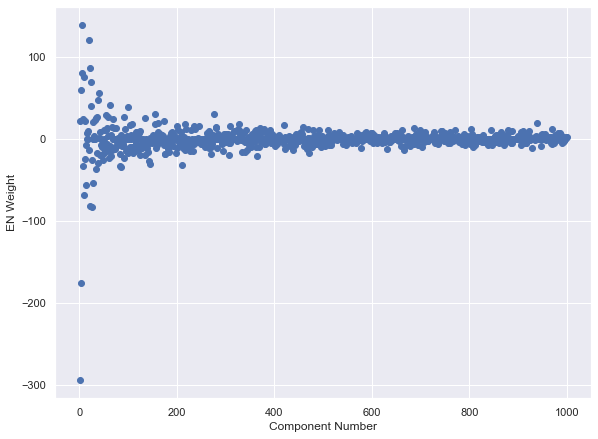

In [5]:
plt.figure(figsize=(9.6, 7.2))
plt.scatter(np.arange(1, df.iloc[0].coefficients.shape[0]+1), df.iloc[0].coefficients)
plt.xlabel('Component Number')
plt.ylabel('EN Weight')

Text(0, 0.5, 'EN Weight (Abs)')

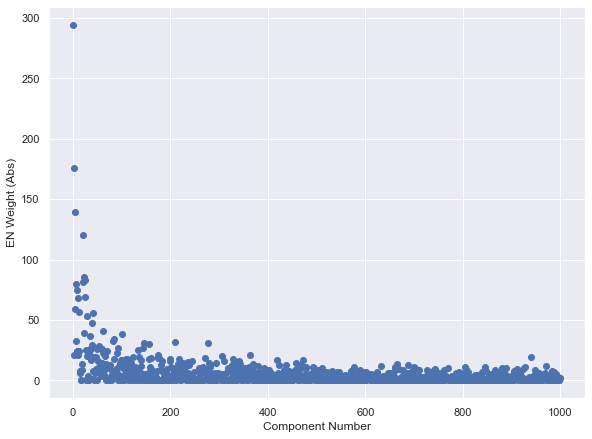

In [6]:
plt.figure(figsize=(9.6, 7.2))
plt.scatter(np.arange(1, df.iloc[0].coefficients.shape[0]+1), abs(df.iloc[0].coefficients))
plt.xlabel('Component Number')
plt.ylabel('EN Weight (Abs)')

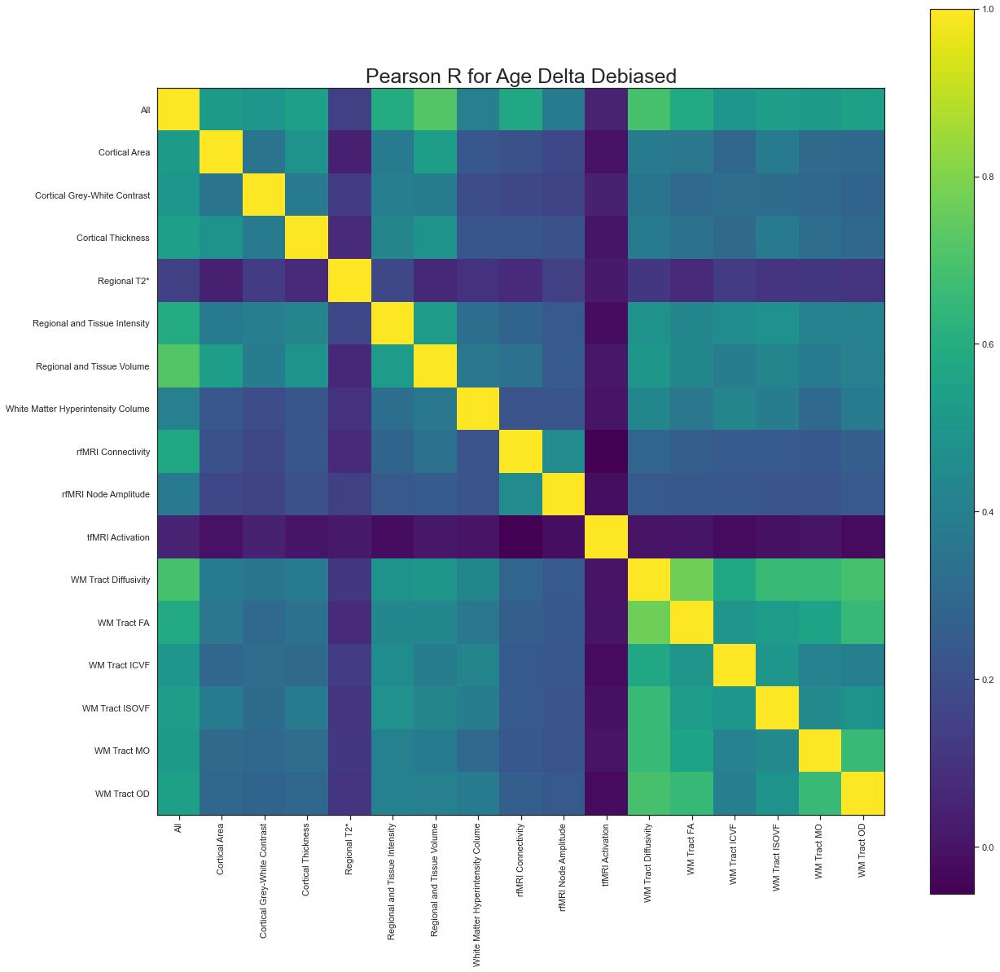

In [85]:
correlation_plot(df, key='age_delta_decon', title='Age Delta Debiased', 
                 partial_correlation=False, fig_size=20)

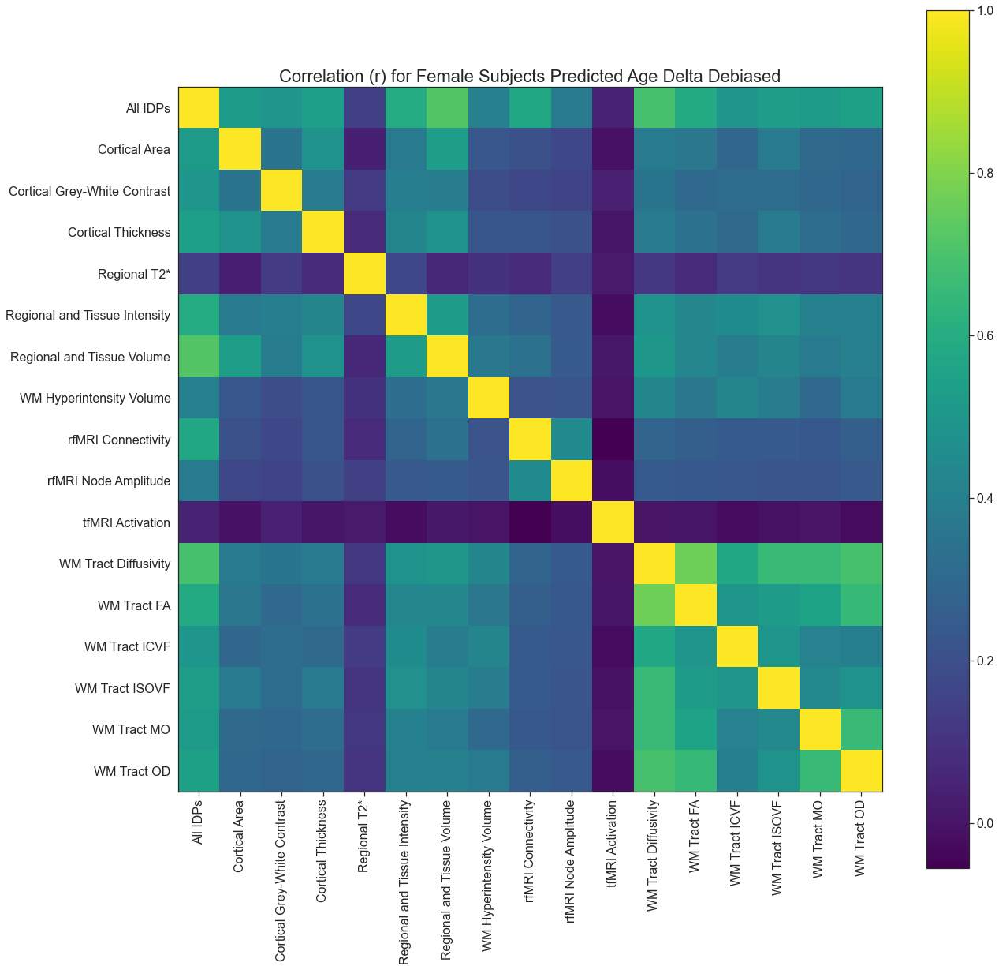

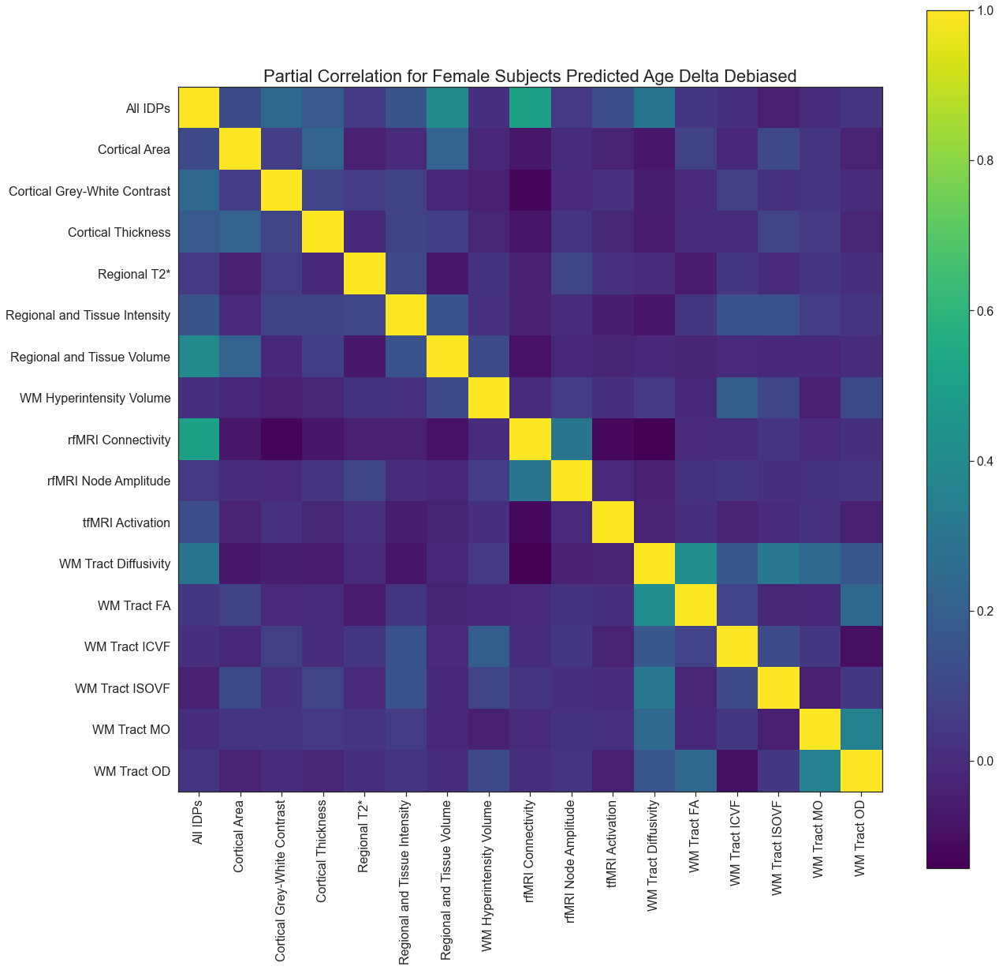

In [105]:
modality_names = ['All IDPs', 'Cortical Area', 'Cortical Grey-White Contrast',
       'Cortical Thickness', 'Regional T2*',
       'Regional and Tissue Intensity', 'Regional and Tissue Volume',
                  'WM Hyperintensity Volume', 'rfMRI Connectivity',
       'rfMRI Node Amplitude', 'tfMRI Activation',
       'WM Tract Diffusivity', 'WM Tract FA', 'WM Tract ICVF',
       'WM Tract ISOVF', 'WM Tract MO', 'WM Tract OD',
        ]

title_font_size=22
ticks_font_size=16
legend_font = 18
figsize=(20, 20)

# correlation_plot(df, key='age_delta_decon', title='Age Delta Debiased', 
#                  partial_correlation=False, fig_size=20)

_ = correlation_plot_fig(df, key='age_delta_decon', title='Female Subjects Predicted Age Delta Debiased', 
                 partial_correlation=False, use_B_testset= True, modality_names=modality_names,
                           title_font_size=title_font_size,
                            ticks_font_size=ticks_font_size,
                            legend_font = legend_font,
                            figsize=figsize,
                            save_fig_title='Female_Correlation_Matrix_IDPs.png'
                          )

_ = correlation_plot_fig(df, key='age_delta_decon', title='Female Subjects Predicted Age Delta Debiased', 
                 partial_correlation=True, use_B_testset= True, modality_names=modality_names,
                           title_font_size=title_font_size,
                            ticks_font_size=ticks_font_size,
                            legend_font = legend_font,
                            figsize=figsize,
                            save_fig_title='Female_PartialCorrelation_Matrix_IDPs.png'
                          )

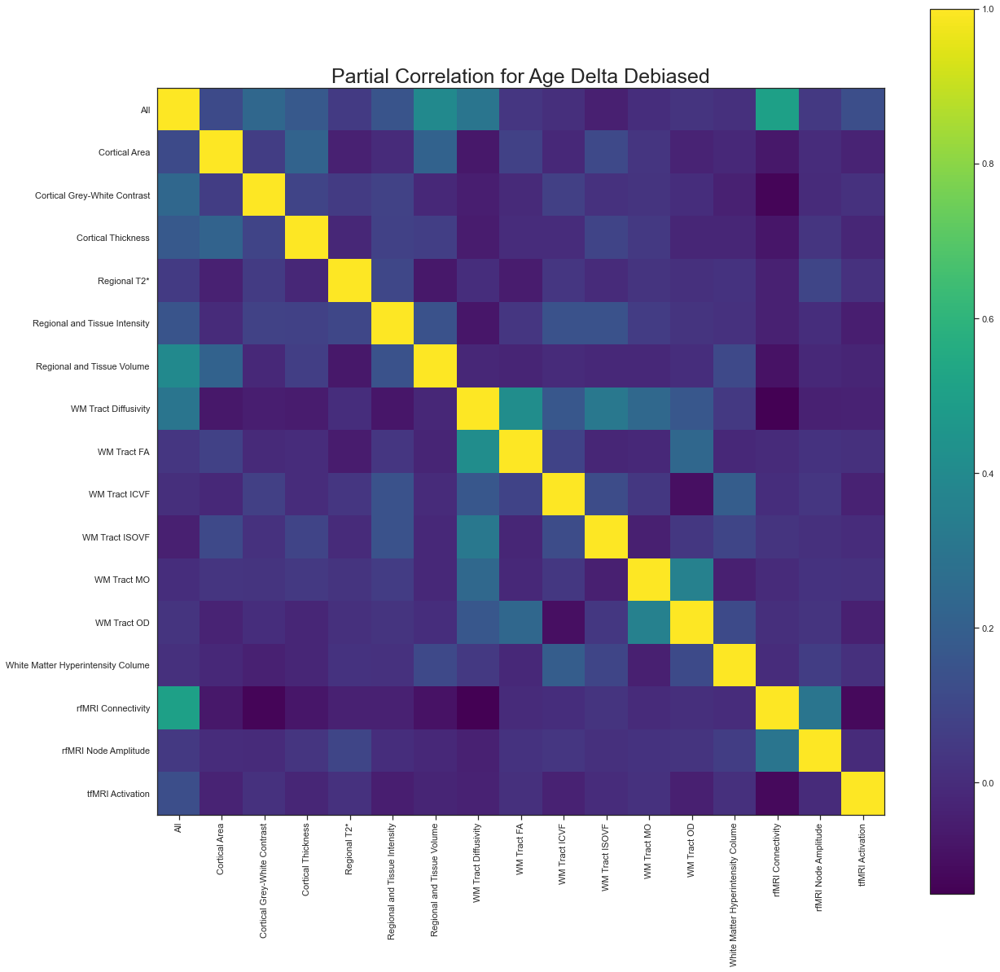

In [33]:
correlation_plot(df, key='age_delta_decon', title='Age Delta Debiased', 
                 partial_correlation=True, fig_size=20)

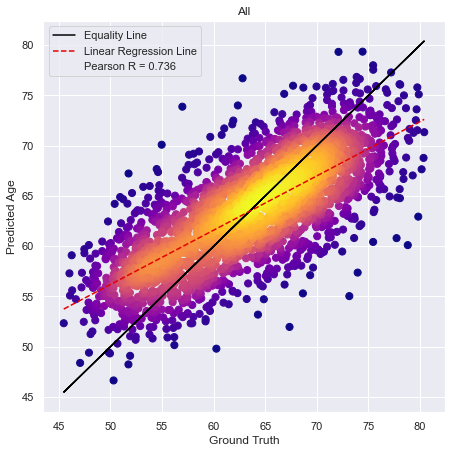

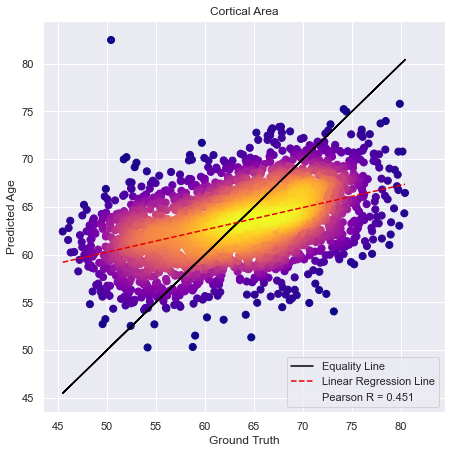

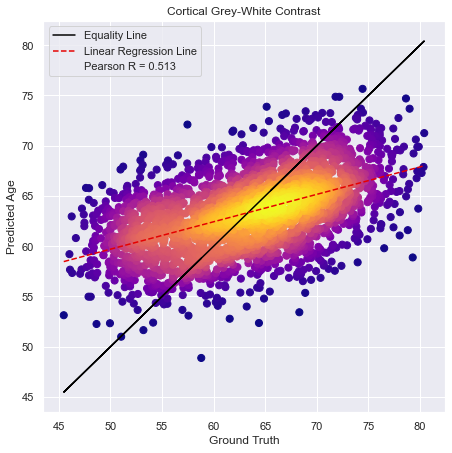

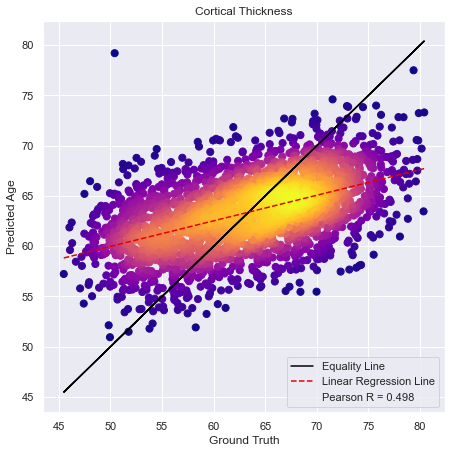

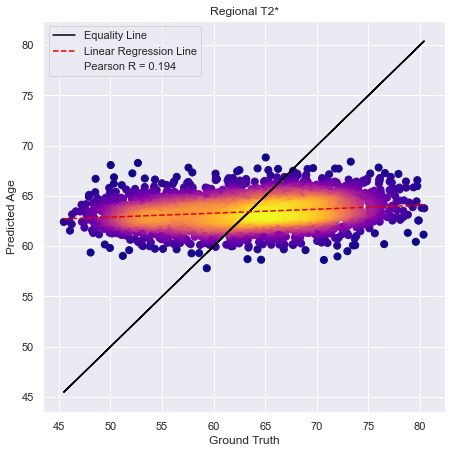

...

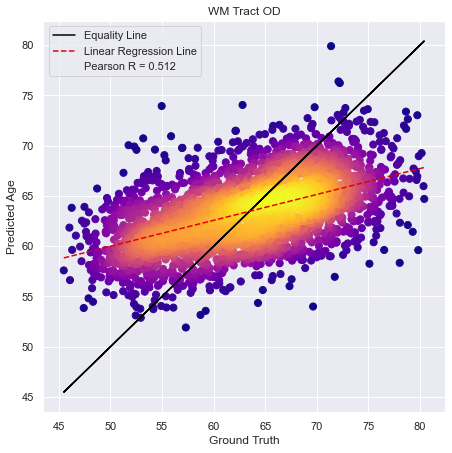

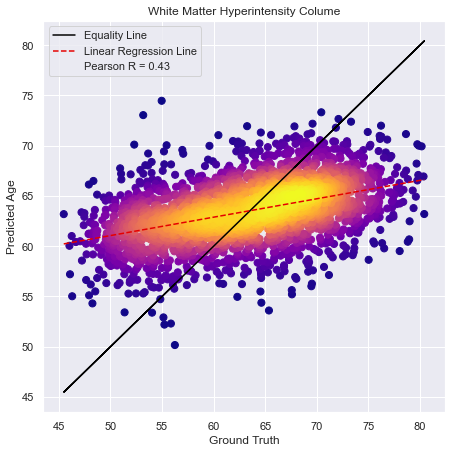

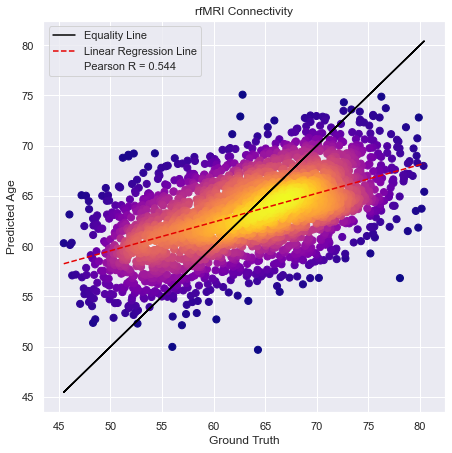

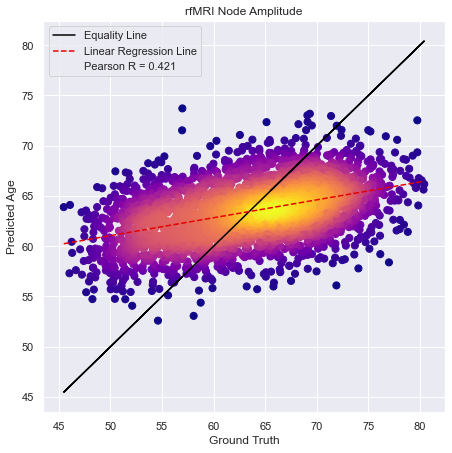

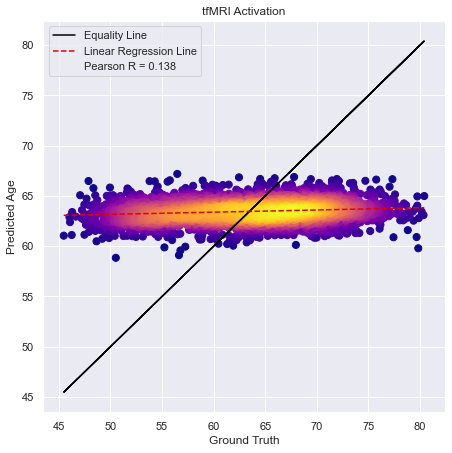

In [34]:
for idx in range(len(df)):
    df_mod = df.iloc[idx].dataframe
    name_mod = df.iloc[idx].modality
    fig = scatter_plot_heatmap(x=df_mod.target_age, y=df_mod.mean_output_age, xlabel='Ground Truth', 
                               ylabel='Predicted Age', title=name_mod, set_scale=True)

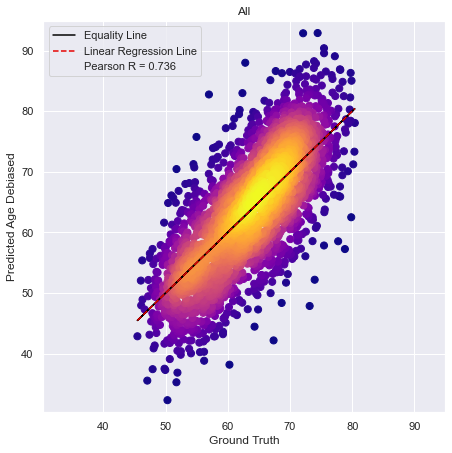

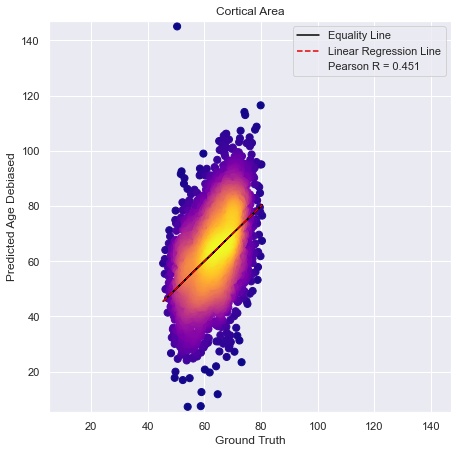

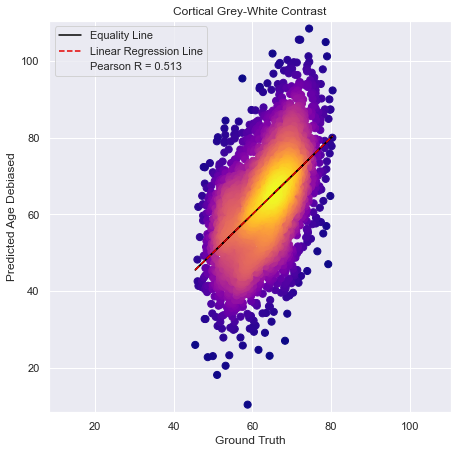

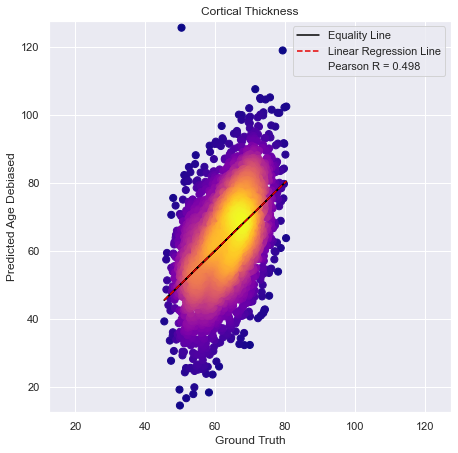

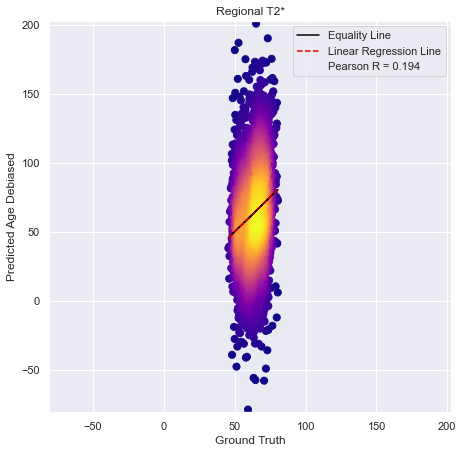

...

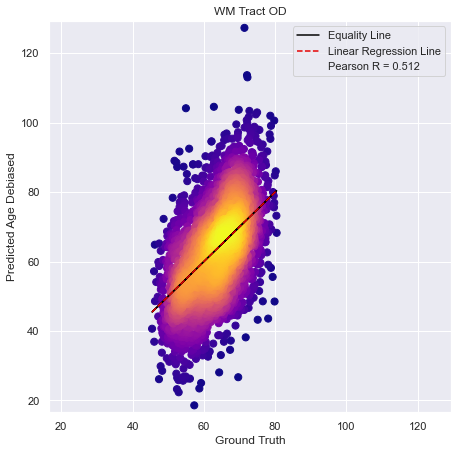

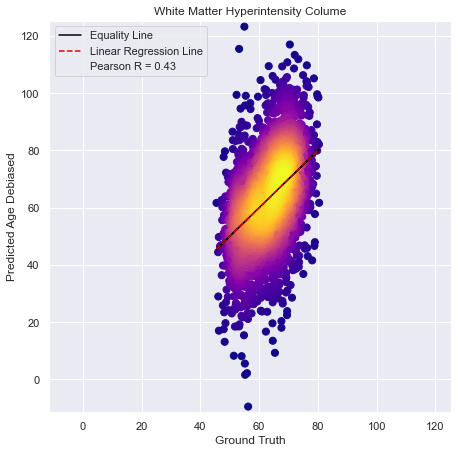

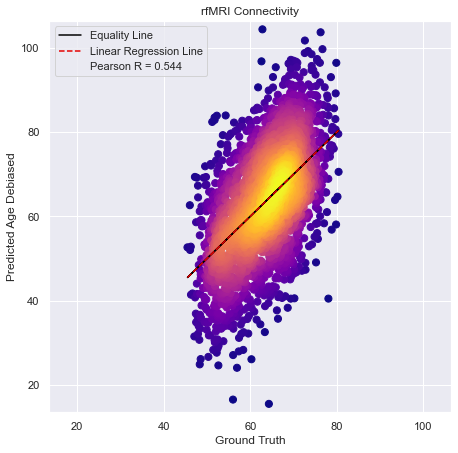

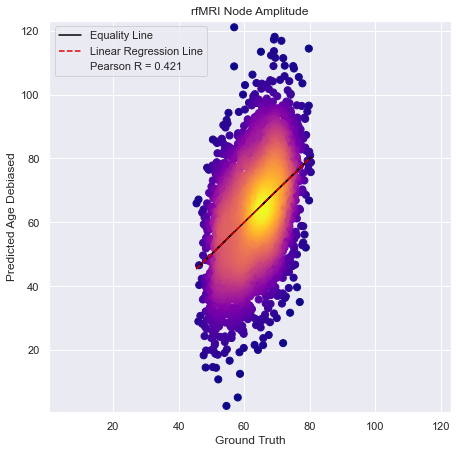

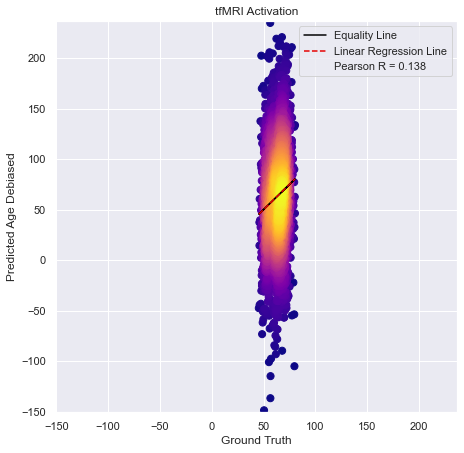

In [35]:
for idx in range(len(df)):
    df_mod = df.iloc[idx].dataframe
    name_mod = df.iloc[idx].modality
    fig = scatter_plot_heatmap(x=df_mod.target_age, y=df_mod.output_age_decon, xlabel='Ground Truth', 
                               ylabel='Predicted Age Debiased', title=name_mod, set_scale=True)

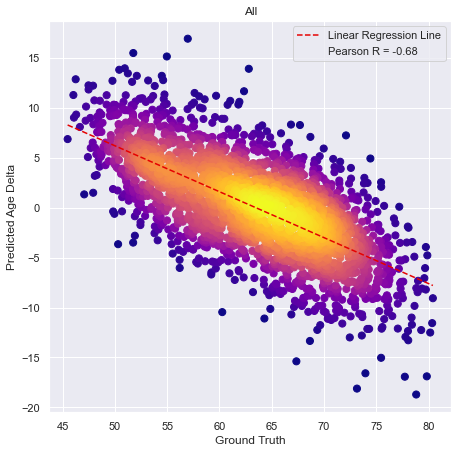

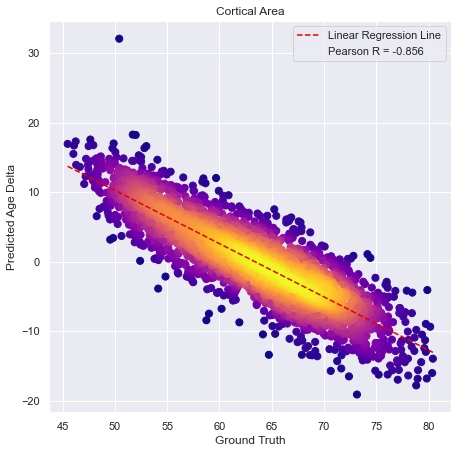

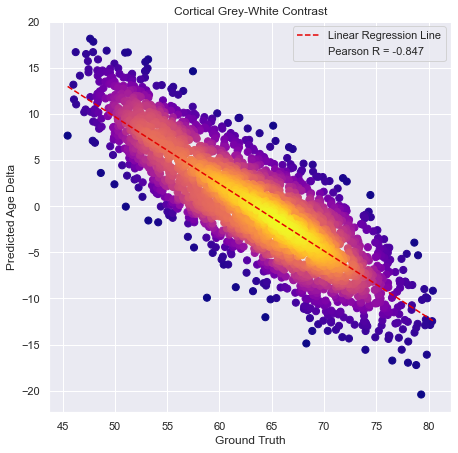

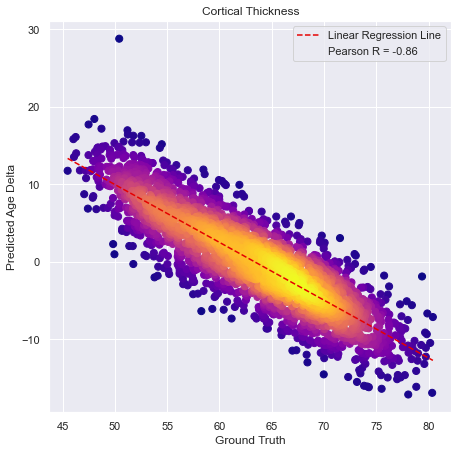

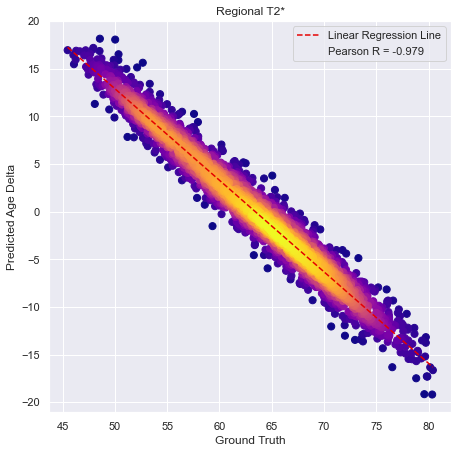

...

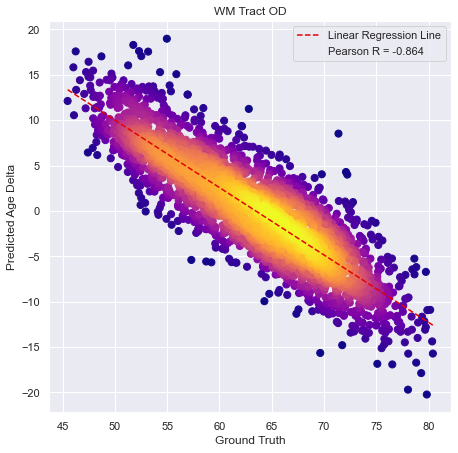

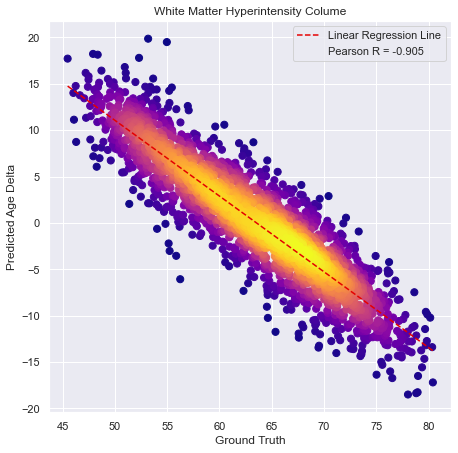

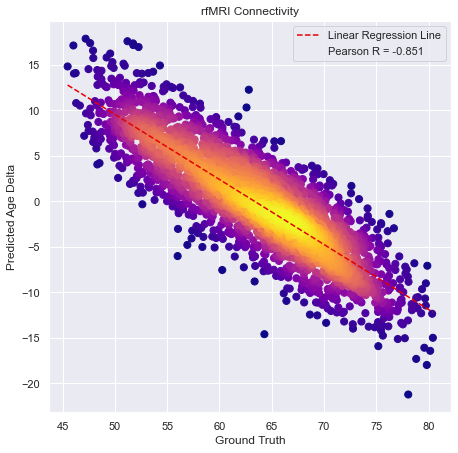

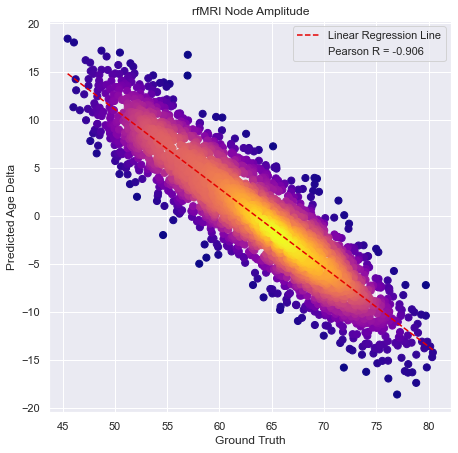

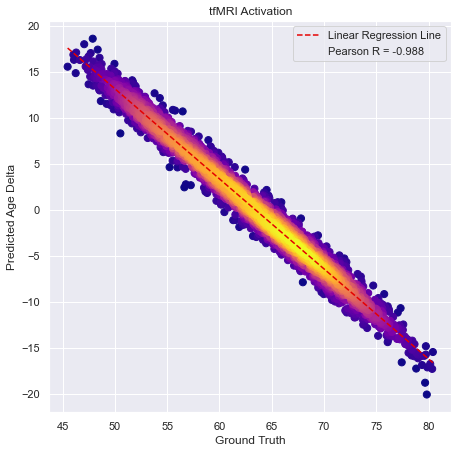

In [36]:
for idx in range(len(df)):
    df_mod = df.iloc[idx].dataframe
    name_mod = df.iloc[idx].modality
    fig = scatter_plot_heatmap(x=df_mod.target_age, y=df_mod.mean_age_delta, xlabel='Ground Truth', 
                               ylabel='Predicted Age Delta', title=name_mod, set_scale=False, 
                               equality_line=False)

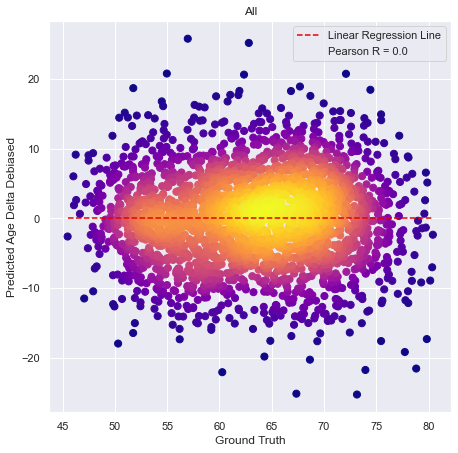

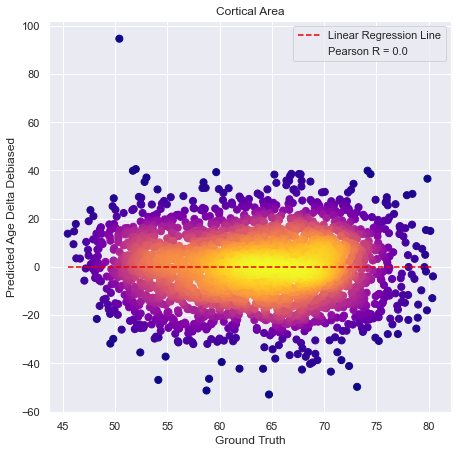

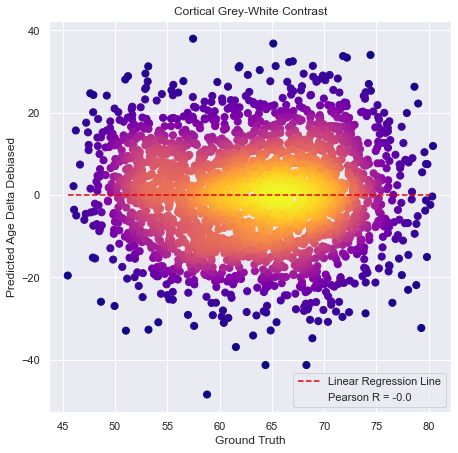

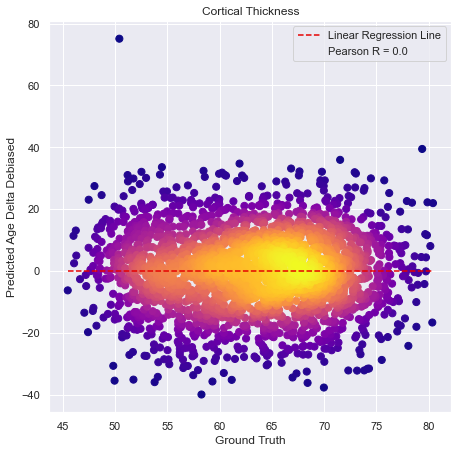

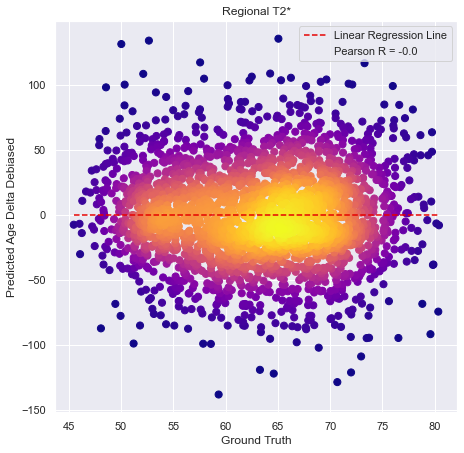

...

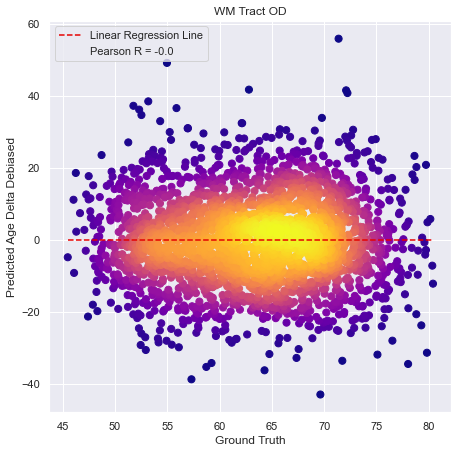

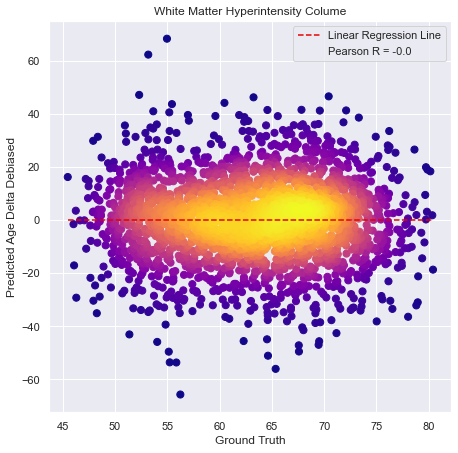

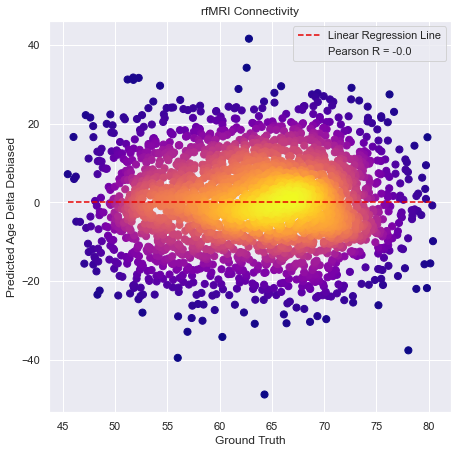

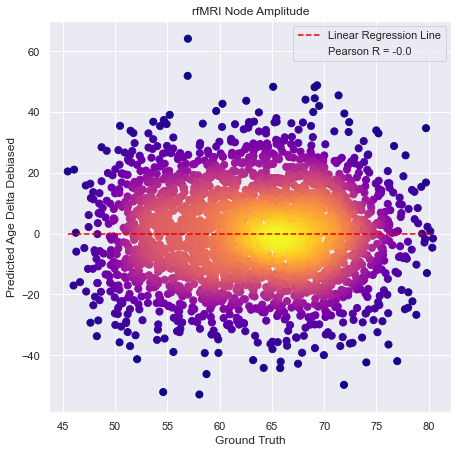

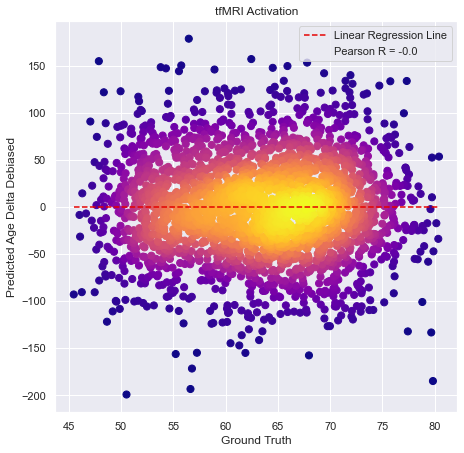

In [37]:
for idx in range(len(df)):
    df_mod = df.iloc[idx].dataframe
    name_mod = df.iloc[idx].modality
    fig = scatter_plot_heatmap(x=df_mod.target_age, y=df_mod.age_delta_decon, xlabel='Ground Truth', 
                               ylabel='Predicted Age Delta Debiased', title=name_mod, set_scale=False, 
                               equality_line=False)

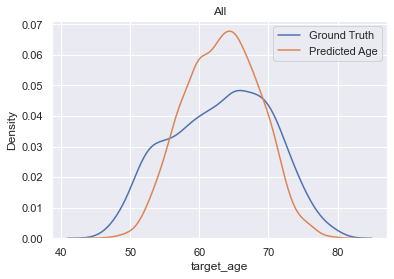

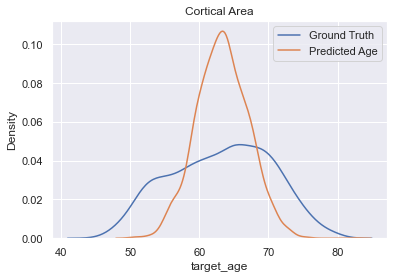

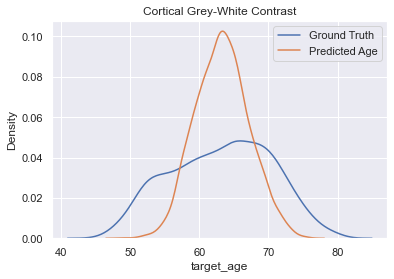

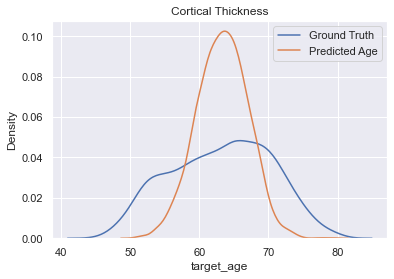

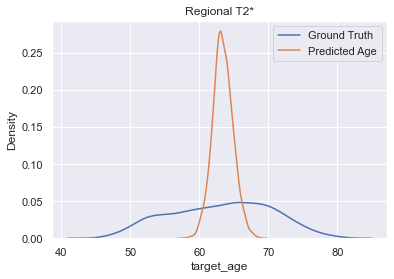

...

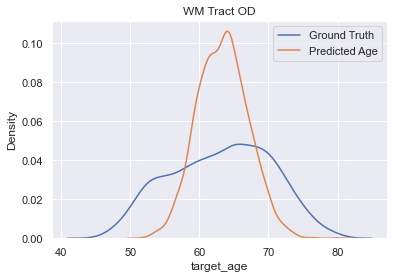

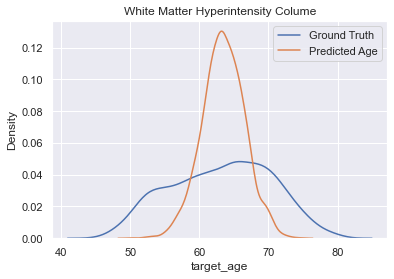

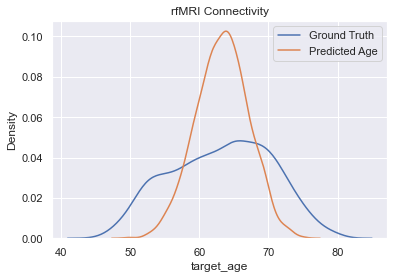

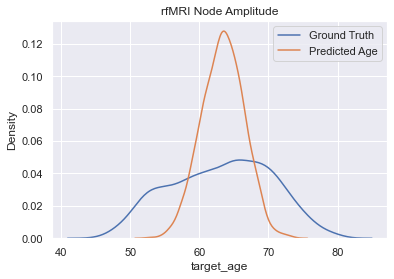

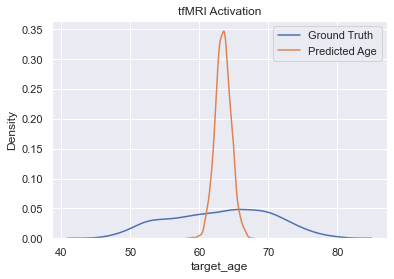

In [38]:
for idx in range(len(df)):
    df_mod = df.iloc[idx].dataframe
    name_mod = df.iloc[idx].modality
    fig = kde_plot(x=df_mod.target_age, y=df_mod.mean_output_age, 
                   xlabel='Ground Truth', ylabel='Predicted Age',
                   title=name_mod)

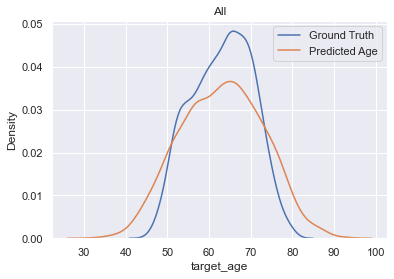

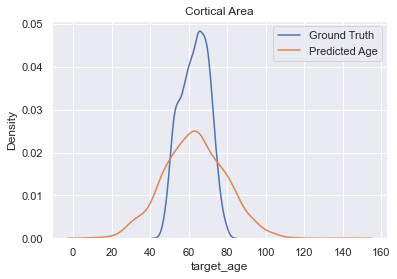

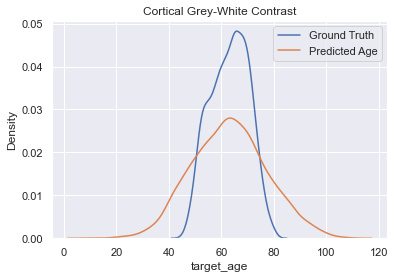

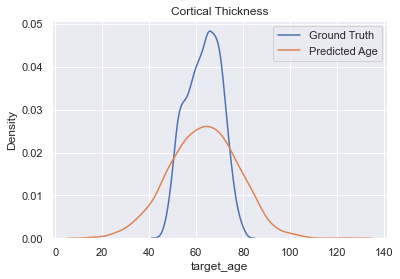

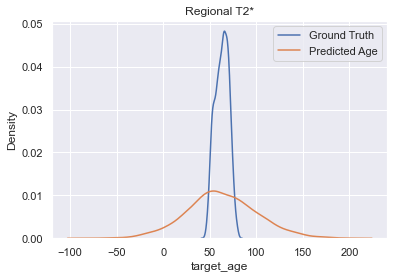

...

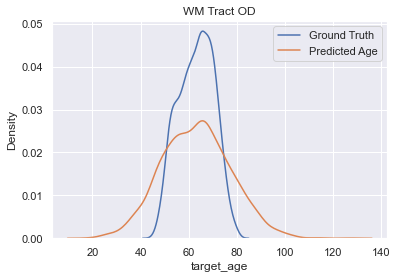

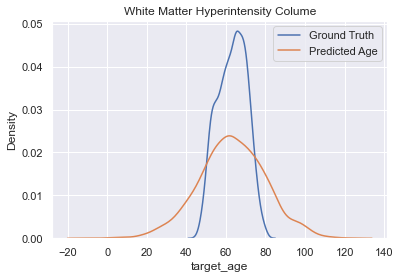

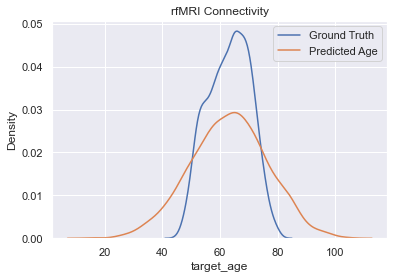

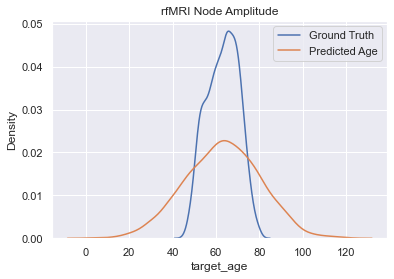

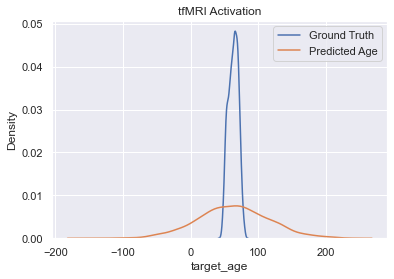

In [39]:
for idx in range(len(df)):
    df_mod = df.iloc[idx].dataframe
    name_mod = df.iloc[idx].modality
    fig = kde_plot(x=df_mod.target_age, y=df_mod.output_age_decon, 
                   xlabel='Ground Truth', ylabel='Predicted Age',
                   title=name_mod)

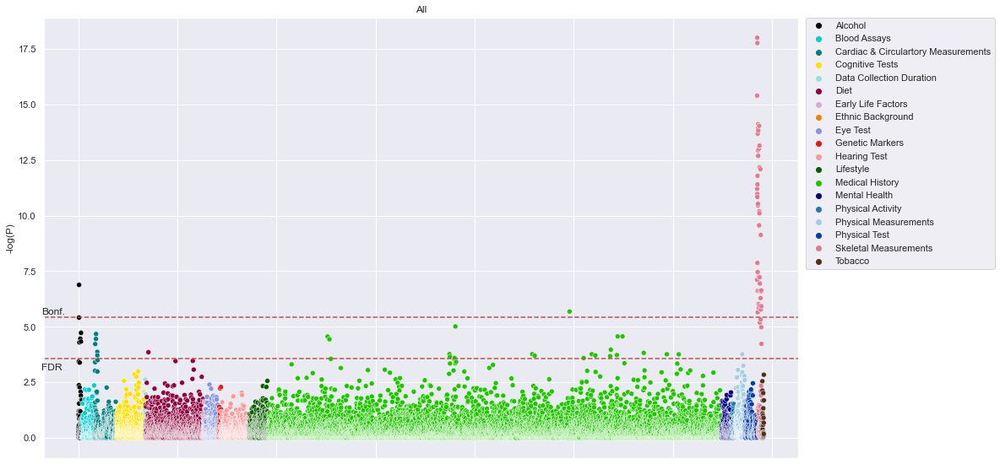

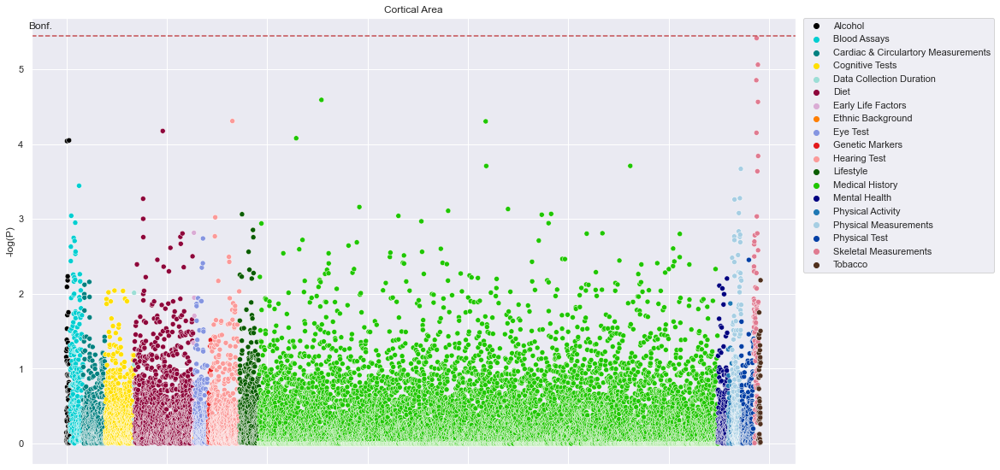

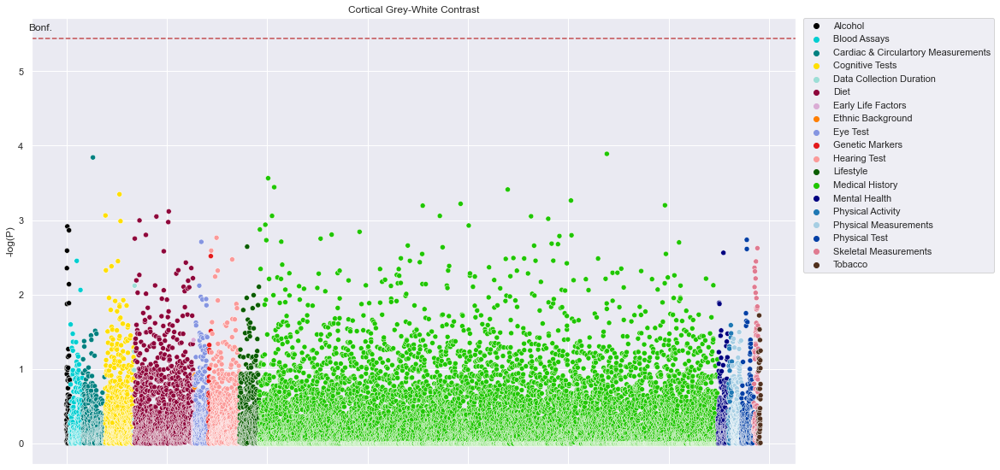

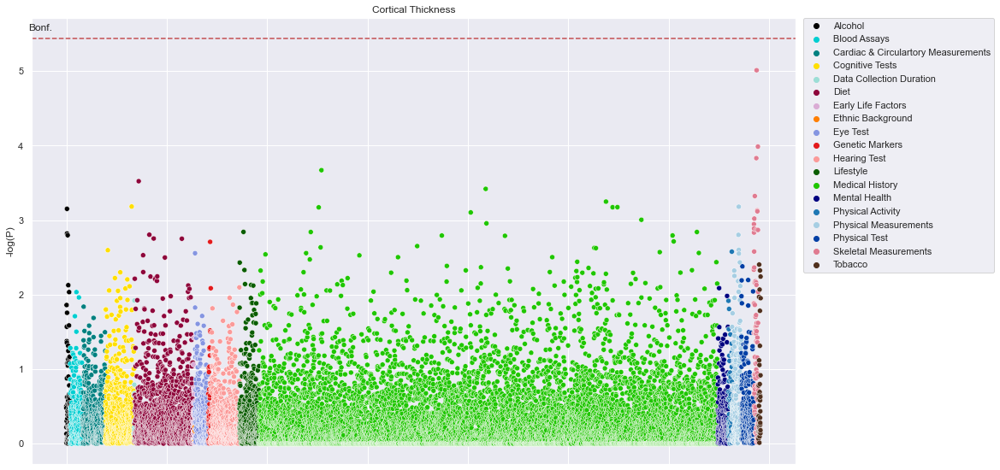

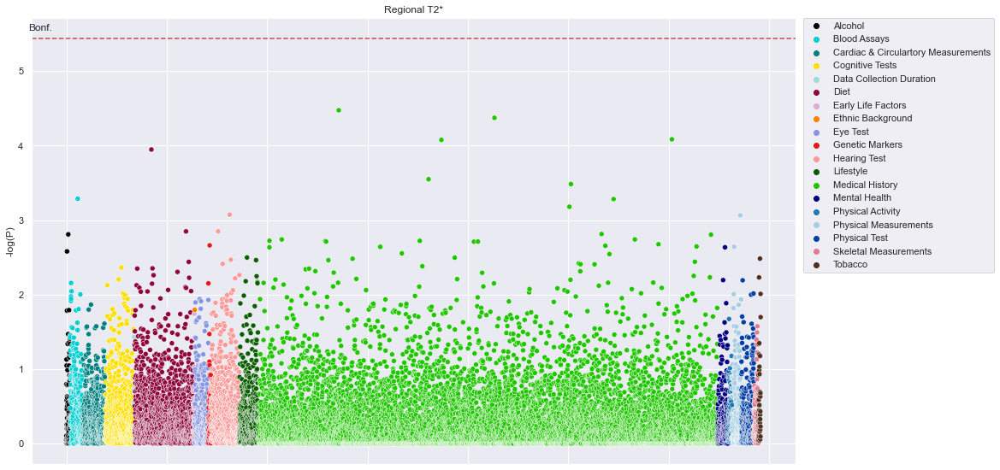

...

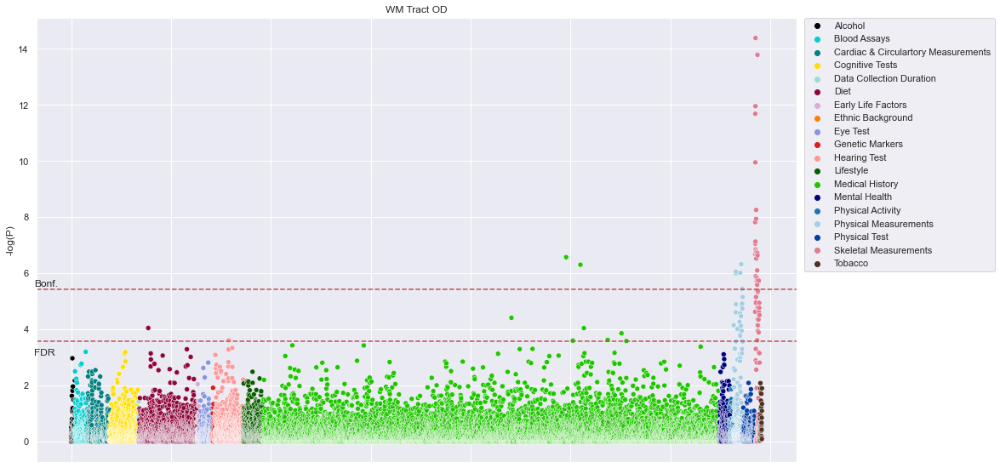

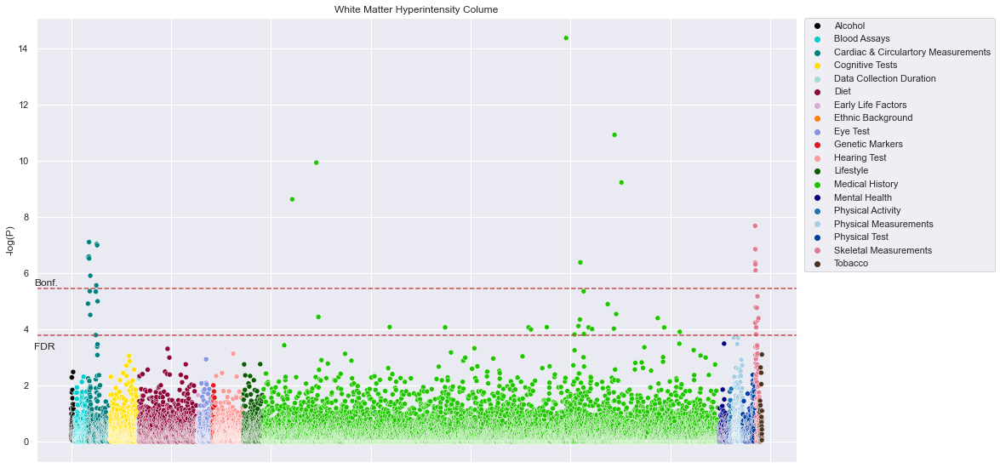

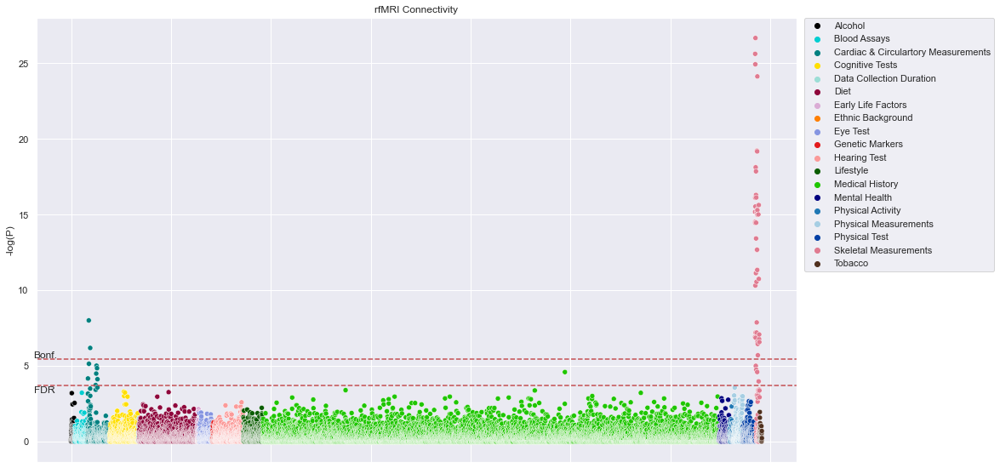

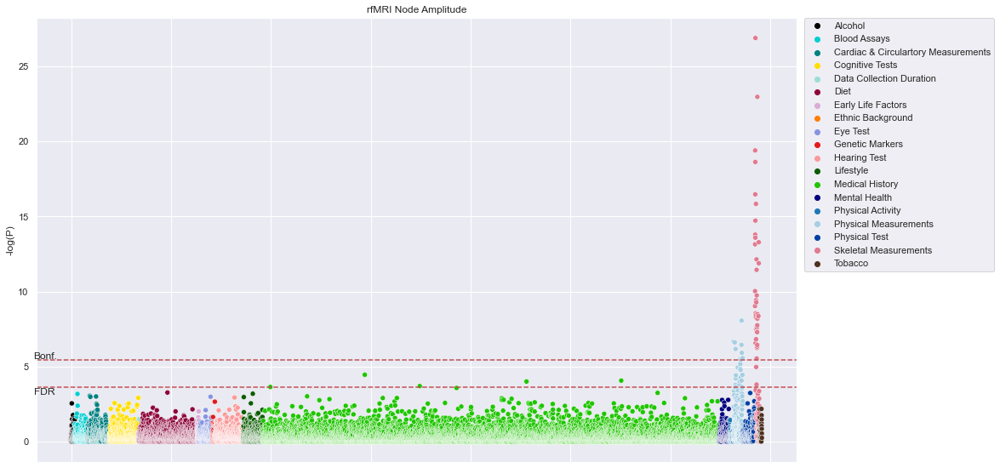

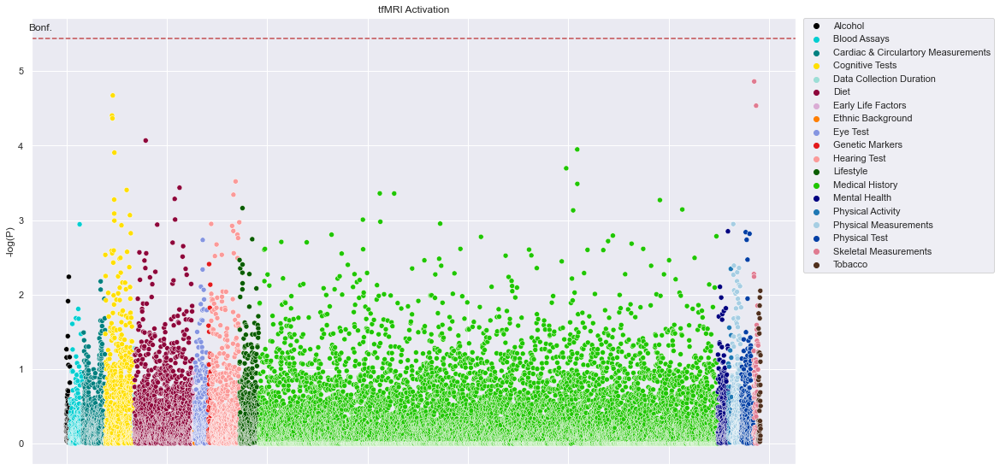

In [43]:
vars_corrs = []
vars_mods = []
vars_bnf_thrs = []
vars_fdr_thrs = []

for idx in range(len(df)):
    df_mod = df.iloc[idx].dataframe
    modality = df.iloc[idx].modality
    age_delta_decon = df_mod.age_delta_decon.to_numpy()
    subjects = df_mod['Unnamed: 0'].to_numpy()
#     subjects, age_delta_decon = align_subjects(subjects, subjects_h5, 
#                                                   age_delta_decon, subjects_to_be_ignored)  

    idx_nans_test = df.iloc[idx].idx_nans_test
    
    
    if deconfound_flag == True:
        age_delta_decon = deconfound_inputs(age_delta_decon, idx_nans_test)
        
    deconf_subset = np.delete(vars_i_deconf_subset, obj = idx_nans_test, axis=0)
        
        
    corr_df, bonferroni_threshold, false_discovery_rate = correlations_and_plots(
                                    age_delta_decon = age_delta_decon, deconf_subset = deconf_subset, 
                                    names_subset = varsHeader_subset, idxs = varsIDX_subset,
                                    categories_subset = vars_categories_subset,
                                    title = modality, corr_flag='vars')
    vars_mods.append(modality)
    vars_corrs.append(corr_df)
    vars_bnf_thrs.append(bonferroni_threshold)
    vars_fdr_thrs.append(false_discovery_rate)
    
vars_df = pd.DataFrame.from_dict({
    'modality': vars_mods,
    'bonf': vars_bnf_thrs,
    'fdr': vars_fdr_thrs,
    'dataframe': vars_corrs
})

In [7]:
vars_df.to_pickle('IDP_predictions_female_vars_testsetB.pkl', protocol = 4)

NameError: name 'vars_df' is not defined

In [7]:
dfNN = pd.read_pickle('female_testB.pkl')

In [8]:
df = pd.read_pickle('IDP_predictions_female_testsetB.pkl')

df = df.reindex([
    0, 1, 2, 3, 4, 5, 6, 13, 14, 15, 16, 7, 8, 9, 10, 11, 12
])


In [9]:
confounds_file = 'female_testB_conf12.h5'
confounds = h5py.File(confounds_file, 'r')
confounds = confounds['conf12'][()]

def deconfound_inputs2(y, confounds):
    
    y = y - y.mean(axis=0)
    if np.sum(np.isnan(y)) == 0:
        beta = np.linalg.pinv(confounds).dot(y)
        beta[np.abs(beta) < 1e-10] = 0
        yd = y - confounds.dot(beta)
        yd = yd - yd.mean()
    else:
        print('ERROR! Encoundered a NaN! Function Needs Updating!')
    
    return yd

In [68]:
names = df.modality.to_list()
namesNN = dfNN.modality.to_list()

key='age_delta_decon'
deconfound = False

corr_df1 = []
for idx1 in range(len(dfNN)):
    df1 = dfNN.iloc[idx1].dataframe
    corr_df2 = []
    for idx2 in range(len(df)):
        df2 = df.iloc[idx2].dataframe
        dfm = pd.merge(df1, df2, on='Unnamed: 0', how='inner')

        keyX = key + '_x'
        keyY = key + '_y'
        
        if deconfound == True:
            counfoundsMerged = None
            elimSubj = list(set(df1['Unnamed: 0']) - set(df2['Unnamed: 0']))
            idx_elim = np.intersect1d(df1['Unnamed: 0'], elimSubj, return_indices=True)[1]
            counfoundsMerged = np.delete(confounds, idx_elim, axis=0)
            dfm[keyX] = deconfound_inputs2(dfm[keyX])
            dfm[keyY] = deconfound_inputs2(dfm[keyY])
            r, _ = pearsonr(dfm[keyX], dfm[keyY])
        else:
            r, _ = pearsonr(dfm[keyX], dfm[keyY])
        
        corr_df2.append(r)
        
    corr_df2 = np.array(corr_df2).astype('float32')
    corr_df1.append(corr_df2)
corr_df1 = np.array(corr_df1).astype('float32')

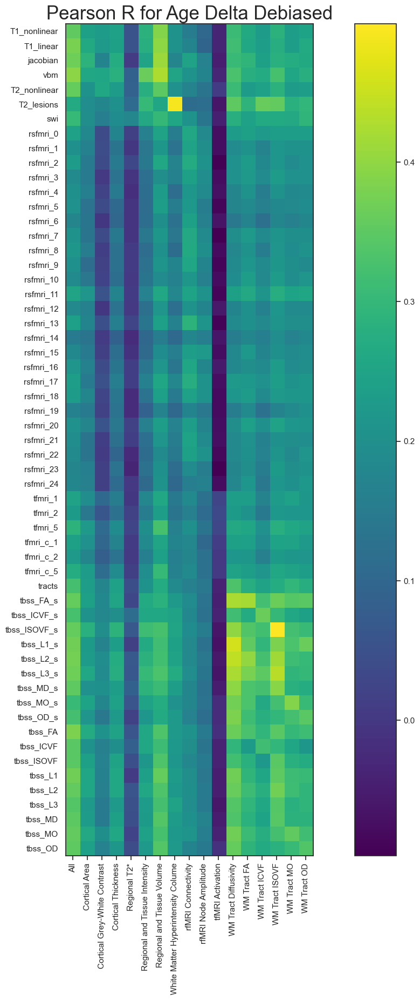

In [69]:
title = 'Pearson R for Age Delta Debiased'
fig_size = 20
fix_colorbar_scale = False

with sns.axes_style("white"):
    if fig_size == None:
        fig = plt.figure() # can set figsize=(fig_size = 12.8, fig_size)
    else:
        fig = plt.figure(figsize=(fig_size, fig_size))
    ax = fig.add_subplot(111)
    if fix_colorbar_scale == True:
        cax = ax.matshow(corr_df1, interpolation='nearest',cmap='viridis', vmin=0, vmax=1)
    else:
        cax = ax.matshow(corr_df1, interpolation='nearest',cmap='viridis')
    fig.colorbar(cax)
    plt.title("{}".format(title), fontsize=fig_size+5 if fig_size != None else 10)
    ax.set_yticks(np.arange(len(namesNN)))
    ax.set_yticklabels(namesNN)
    ax.xaxis.set_ticks_position("bottom")
    ax.set_xticks(np.arange(len(names)))
    ax.set_xticklabels(names, rotation=90)
    plt.show()

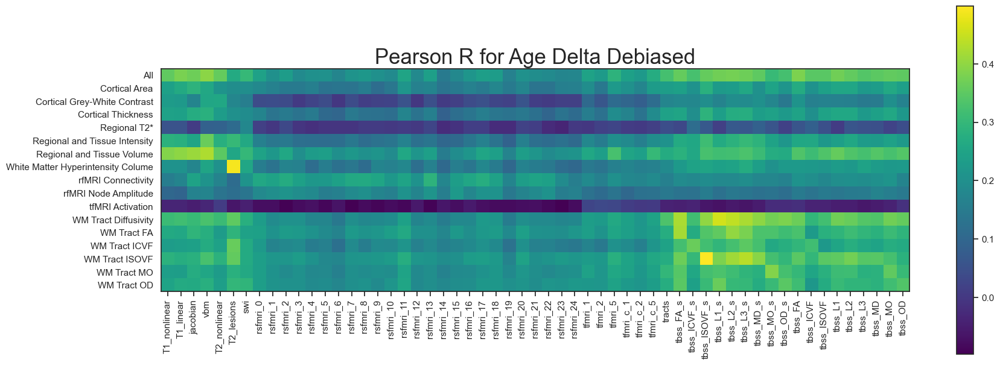

In [70]:
title = 'Pearson R for Age Delta Debiased'
fig_size = None
fix_colorbar_scale = False

with sns.axes_style("white"):
    fig = plt.figure(figsize=(20, 7.5))
    ax = fig.add_subplot(111)
    if fix_colorbar_scale == True:
        cax = ax.matshow(corr_df1.T, interpolation='nearest',cmap='viridis', vmin=0, vmax=1)
    else:
        cax = ax.matshow(corr_df1.T, interpolation='nearest',cmap='viridis')
    fig.colorbar(cax)
    plt.title("{}".format(title), fontsize=25)
    ax.set_yticks(np.arange(len(names)))
    ax.set_yticklabels(names)
    ax.xaxis.set_ticks_position("bottom")
    ax.set_xticks(np.arange(len(namesNN)))
    ax.set_xticklabels(namesNN, rotation=90)
    plt.show()

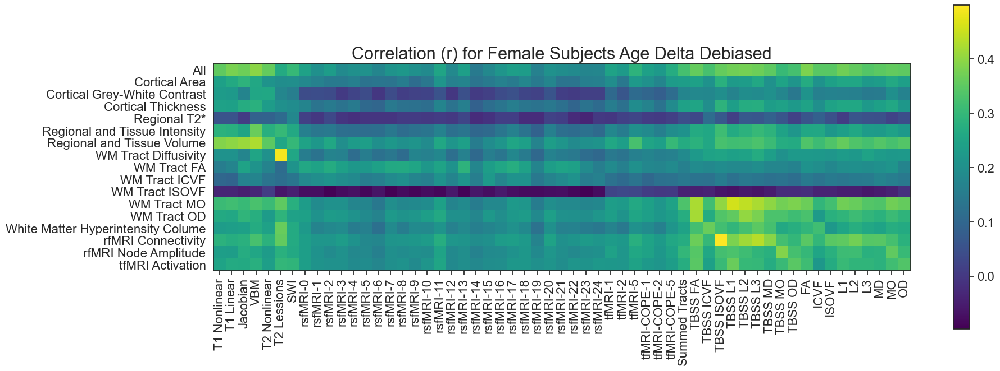

In [71]:
modality_names = ['All IDPs', 'Cortical Area', 'Cortical Grey-White Contrast',
       'Cortical Thickness', 'Regional T2*',
       'Regional and Tissue Intensity', 'Regional and Tissue Volume',
                  'WM Hyperintensity Volume', 'rfMRI Connectivity',
       'rfMRI Node Amplitude', 'tfMRI Activation',
       'WM Tract Diffusivity', 'WM Tract FA', 'WM Tract ICVF',
       'WM Tract ISOVF', 'WM Tract MO', 'WM Tract OD',
        ]

namesNN = [
    'T1 Nonlinear', 'T1 Linear', 'Jacobian', 'VBM', 'T2 Nonlinear', 'T2 Lessions', 'SWI', 'rsfMRI-0', 'rsfMRI-1',
    'rsfMRI-2', 'rsfMRI-3', 'rsfMRI-4', 'rsfMRI-5', 'rsfMRI-6', 'rsfMRI-7', 'rsfMRI-8', 'rsfMRI-9', 'rsfMRI-10', 
    'rsfMRI-11', 'rsfMRI-12', 'rsfMRI-13', 'rsfMRI-14', 'rsfMRI-15', 'rsfMRI-16', 'rsfMRI-17', 'rsfMRI-18', 'rsfMRI-19',
    'rsfMRI-20', 'rsfMRI-21', 'rsfMRI-22', 'rsfMRI-23', 'rsfMRI-24', 'tfMRI-1', 'tfMRI-2', 'tfMRI-5', 'tfMRI-COPE-1',
    'tfMRI-COPE-2', 'tfMRI-COPE-5', 'Summed Tracts', 'TBSS FA', 'TBSS ICVF', 'TBSS ISOVF', 'TBSS L1', 'TBSS L2',
    'TBSS L3', 'TBSS MD', 'TBSS MO', 'TBSS OD', 'FA', 'ICVF', 'ISOVF', 'L1', 'L2', 'L3', 'MD', 'MO', 'OD'
]

title_font_size=22
ticks_font_size=16
legend_font = 18
# figsize=(20, 20)

title = 'Correlation (r) for Female Subjects Age Delta Debiased'
fig_size = None
fix_colorbar_scale = False

with sns.axes_style("white"):
    fig = plt.figure(figsize=(20, 7.5))
    ax = fig.add_subplot(111)
    if fix_colorbar_scale == True:
        cax = ax.matshow(corr_df1.T, interpolation='nearest',cmap='viridis', vmin=0, vmax=1)
    else:
        cax = ax.matshow(corr_df1.T, interpolation='nearest',cmap='viridis')
    cbar = fig.colorbar(cax)
    cbar.ax.tick_params(labelsize=ticks_font_size)
    plt.title("{}".format(title), fontsize=title_font_size)
    ax.set_yticks(np.arange(len(namesIDPs)), fontsize= ticks_font_size)
    ax.set_yticklabels(namesIDPs, fontsize= ticks_font_size)
    ax.xaxis.set_ticks_position("bottom")
    ax.set_xticks(np.arange(len(namesNN)), fontsize= ticks_font_size)
    ax.set_xticklabels(namesNN, rotation=90, fontsize= ticks_font_size)
    
    plt.savefig('Famel_Correlation_Matrix_MODALITIES_and_IDPs.png', bbox_inches='tight')
    
    plt.show()

In [11]:
df

,modality,SVD J,MAEs,PRs,MAEs_debiased,PRs_debiased,Qs,coefficients,intercept,alphas,l1_ratios,dataframe,idx_nans_test
0,All,1000,3.944172,0.736224,5.312553,0.736224,2.687405,"[-294.35993525380024, 21.133151582876717, -175...",-1.627664e-02,0.000366,1.00,Unnamed: 0 mean_output_age mean_age_de...,"[61, 182, 231, 431, 432, 455, 1092, 1102, 1350..."
1,Cortical Area,0,5.277573,0.451202,11.447095,0.451202,2.231115,"[0.0, 0.3643615923027196, 0.07957667223237505,...",-1.356477e-02,0.007275,0.50,Unnamed: 0 mean_output_age mean_age_de...,"[61, 231, 431, 432, 455, 1092, 1102, 1350, 153..."
2,Cortical Grey-White Contrast,70,5.062944,0.512828,9.730955,0.512828,2.103351,"[-248.4516622125567, -145.35642106143985, -133...",-1.168070e-02,0.000135,0.99,Unnamed: 0 mean_output_age mean_age_de...,"[61, 432, 1102, 1350, 1530, 1689, 1706, 2307]"
3,Cortical Thickness,306,5.126076,0.497889,10.074157,0.497889,2.089231,"[-152.66021736067128, 9.007920912286798, -1.97...",-1.356477e-02,0.000301,0.99,Unnamed: 0 mean_output_age mean_age_de...,"[61, 231, 431, 432, 455, 1092, 1102, 1350, 153..."
4,Regional T2*,0,5.939897,0.193570,29.111454,0.193570,1.950930,"[0.8183900055855015, 0.6534309717935721, 0.352...",-2.691982e-03,0.016240,0.10,Unnamed: 0 mean_output_age mean_age_de...,[182]
5,Regional and Tissue Intensity,0,4.823697,0.569063,8.351785,0.569063,2.323200,"[-2.0261140100008066, 0.5722035732571632, -0.3...",-1.168088e-02,0.014730,0.70,Unnamed: 0 mean_output_age mean_age_de...,"[61, 432, 1102, 1350, 1530, 1689, 1706, 2307]"
6,Regional and Tissue Volume,647,4.181287,0.700952,5.813769,0.700952,2.657055,"[-307.9613739584205, 45.169492671126136, 57.40...",-1.356477e-02,0.000209,0.99,Unnamed: 0 mean_output_age mean_age_de...,"[61, 231, 431, 432, 455, 1092, 1102, 1350, 153..."
13,White Matter Hyperintensity Colume,2,5.388774,0.429590,11.961929,0.429590,2.462818,"[-287.7111194835061, 106.35742464162345]",-4.150899e-15,0.000031,1.00,Unnamed: 0 mean_output_age mean_age_de...,[]
14,rfMRI Connectivity,1000,4.988115,0.544110,8.964847,0.544110,2.497196,"[62.053602945653516, -9.976616454272259, 0.770...",-3.978255e-15,0.000585,1.00,Unnamed: 0 mean_output_age mean_age_de...,[]
15,rfMRI Node Amplitude,0,5.459125,0.420795,12.562954,0.420795,2.553160,"[0.1599310048268759, 0.7658346314793367, 0.135...",-4.200319e-15,0.032181,0.10,Unnamed: 0 mean_output_age mean_age_de...,[]


In [10]:
names = df.modality.to_list()
namesNN = dfNN.modality.to_list()

key='age_delta_decon'
deconfound = True

corr_df1 = []
for idx1 in range(len(dfNN)):
    df1 = dfNN.iloc[idx1].dataframe
    corr_df2 = []
    for idx2 in range(len(df)):
        df2 = df.iloc[idx2].dataframe
        dfm = pd.merge(df1, df2, on='Unnamed: 0', how='inner')

        keyX = key + '_x'
        keyY = key + '_y'
        
        if deconfound == True:
            counfoundsMerged = None
            elimSubj = list(set(df1['Unnamed: 0']) - set(df2['Unnamed: 0']))
            idx_elim = np.intersect1d(df1['Unnamed: 0'], elimSubj, return_indices=True)[1]
            counfoundsMerged = np.delete(confounds, idx_elim, axis=0)
            dfm[keyX] = deconfound_inputs2(dfm[keyX], counfoundsMerged)
            dfm[keyY] = deconfound_inputs2(dfm[keyY], counfoundsMerged)
            r, _ = pearsonr(dfm[keyX], dfm[keyY])
        else:
            r, _ = pearsonr(dfm[keyX], dfm[keyY])
        
        corr_df2.append(r)
        
    corr_df2 = np.array(corr_df2).astype('float32')
    corr_df1.append(corr_df2)
corr_df1 = np.array(corr_df1).astype('float32')

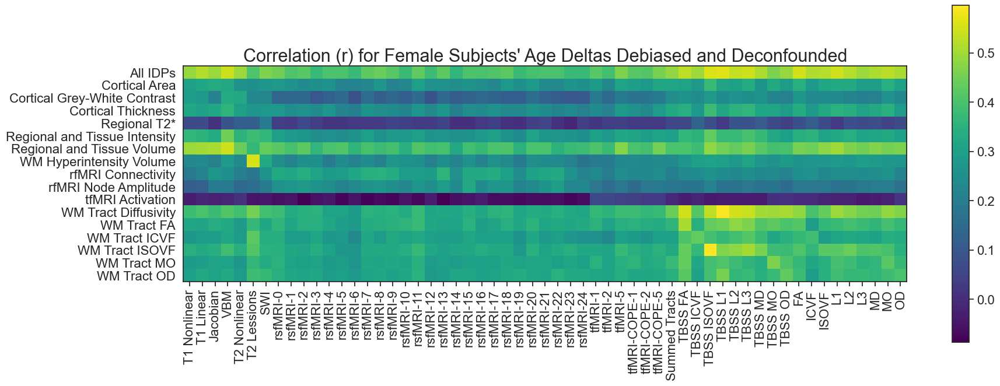

In [11]:
modality_names = ['All IDPs', 'Cortical Area', 'Cortical Grey-White Contrast',
       'Cortical Thickness', 'Regional T2*',
       'Regional and Tissue Intensity', 'Regional and Tissue Volume',
                  'WM Hyperintensity Volume', 'rfMRI Connectivity',
       'rfMRI Node Amplitude', 'tfMRI Activation',
       'WM Tract Diffusivity', 'WM Tract FA', 'WM Tract ICVF',
       'WM Tract ISOVF', 'WM Tract MO', 'WM Tract OD',
        ]

namesNN = [
    'T1 Nonlinear', 'T1 Linear', 'Jacobian', 'VBM', 'T2 Nonlinear', 'T2 Lessions', 'SWI', 'rsfMRI-0', 'rsfMRI-1',
    'rsfMRI-2', 'rsfMRI-3', 'rsfMRI-4', 'rsfMRI-5', 'rsfMRI-6', 'rsfMRI-7', 'rsfMRI-8', 'rsfMRI-9', 'rsfMRI-10', 
    'rsfMRI-11', 'rsfMRI-12', 'rsfMRI-13', 'rsfMRI-14', 'rsfMRI-15', 'rsfMRI-16', 'rsfMRI-17', 'rsfMRI-18', 'rsfMRI-19',
    'rsfMRI-20', 'rsfMRI-21', 'rsfMRI-22', 'rsfMRI-23', 'rsfMRI-24', 'tfMRI-1', 'tfMRI-2', 'tfMRI-5', 'tfMRI-COPE-1',
    'tfMRI-COPE-2', 'tfMRI-COPE-5', 'Summed Tracts', 'TBSS FA', 'TBSS ICVF', 'TBSS ISOVF', 'TBSS L1', 'TBSS L2',
    'TBSS L3', 'TBSS MD', 'TBSS MO', 'TBSS OD', 'FA', 'ICVF', 'ISOVF', 'L1', 'L2', 'L3', 'MD', 'MO', 'OD'
]

title_font_size=22
ticks_font_size=16
legend_font = 18
# figsize=(20, 20)

title = "Correlation (r) for Female Subjects' Age Deltas Debiased and Deconfounded"
fig_size = None
fix_colorbar_scale = False

with sns.axes_style("white"):
    fig = plt.figure(figsize=(20, 7.5))
    ax = fig.add_subplot(111)
    if fix_colorbar_scale == True:
        cax = ax.matshow(corr_df1.T, interpolation='nearest',cmap='viridis', vmin=0, vmax=1)
    else:
        cax = ax.matshow(corr_df1.T, interpolation='nearest',cmap='viridis')
    cbar = fig.colorbar(cax)
    cbar.ax.tick_params(labelsize=ticks_font_size)
    plt.title("{}".format(title), fontsize=title_font_size)
    ax.set_yticks(np.arange(len(modality_names)), fontsize= ticks_font_size)
    ax.set_yticklabels(modality_names, fontsize= ticks_font_size)
    ax.xaxis.set_ticks_position("bottom")
    ax.set_xticks(np.arange(len(namesNN)), fontsize= ticks_font_size)
    ax.set_xticklabels(namesNN, rotation=90, fontsize= ticks_font_size)
    
    plt.savefig('Famel_Correlation_Matrix_MODALITIES_and_IDPs_Deconfounded.png', bbox_inches='tight')
    
    plt.show()

In [38]:
df

,modality,SVD J,MAEs,PRs,MAEs_debiased,PRs_debiased,Qs,coefficients,intercept,alphas,l1_ratios,dataframe,idx_nans_test
0,All,1000,3.944172,0.736224,5.312553,0.736224,2.687405,"[-294.35993525380024, 21.133151582876717, -175...",-1.627664e-02,0.000366,1.00,Unnamed: 0 mean_output_age mean_age_de...,"[61, 182, 231, 431, 432, 455, 1092, 1102, 1350..."
1,Cortical Area,0,5.277573,0.451202,11.447095,0.451202,2.231115,"[0.0, 0.3643615923027196, 0.07957667223237505,...",-1.356477e-02,0.007275,0.50,Unnamed: 0 mean_output_age mean_age_de...,"[61, 231, 431, 432, 455, 1092, 1102, 1350, 153..."
2,Cortical Grey-White Contrast,70,5.062944,0.512828,9.730955,0.512828,2.103351,"[-248.4516622125567, -145.35642106143985, -133...",-1.168070e-02,0.000135,0.99,Unnamed: 0 mean_output_age mean_age_de...,"[61, 432, 1102, 1350, 1530, 1689, 1706, 2307]"
3,Cortical Thickness,306,5.126076,0.497889,10.074157,0.497889,2.089231,"[-152.66021736067128, 9.007920912286798, -1.97...",-1.356477e-02,0.000301,0.99,Unnamed: 0 mean_output_age mean_age_de...,"[61, 231, 431, 432, 455, 1092, 1102, 1350, 153..."
4,Regional T2*,0,5.939897,0.193570,29.111454,0.193570,1.950930,"[0.8183900055855015, 0.6534309717935721, 0.352...",-2.691982e-03,0.016240,0.10,Unnamed: 0 mean_output_age mean_age_de...,[182]
5,Regional and Tissue Intensity,0,4.823697,0.569063,8.351785,0.569063,2.323200,"[-2.0261140100008066, 0.5722035732571632, -0.3...",-1.168088e-02,0.014730,0.70,Unnamed: 0 mean_output_age mean_age_de...,"[61, 432, 1102, 1350, 1530, 1689, 1706, 2307]"
6,Regional and Tissue Volume,647,4.181287,0.700952,5.813769,0.700952,2.657055,"[-307.9613739584205, 45.169492671126136, 57.40...",-1.356477e-02,0.000209,0.99,Unnamed: 0 mean_output_age mean_age_de...,"[61, 231, 431, 432, 455, 1092, 1102, 1350, 153..."
13,White Matter Hyperintensity Colume,2,5.388774,0.429590,11.961929,0.429590,2.462818,"[-287.7111194835061, 106.35742464162345]",-4.150899e-15,0.000031,1.00,Unnamed: 0 mean_output_age mean_age_de...,[]
14,rfMRI Connectivity,1000,4.988115,0.544110,8.964847,0.544110,2.497196,"[62.053602945653516, -9.976616454272259, 0.770...",-3.978255e-15,0.000585,1.00,Unnamed: 0 mean_output_age mean_age_de...,[]
15,rfMRI Node Amplitude,0,5.459125,0.420795,12.562954,0.420795,2.553160,"[0.1599310048268759, 0.7658346314793367, 0.135...",-4.200319e-15,0.032181,0.10,Unnamed: 0 mean_output_age mean_age_de...,[]


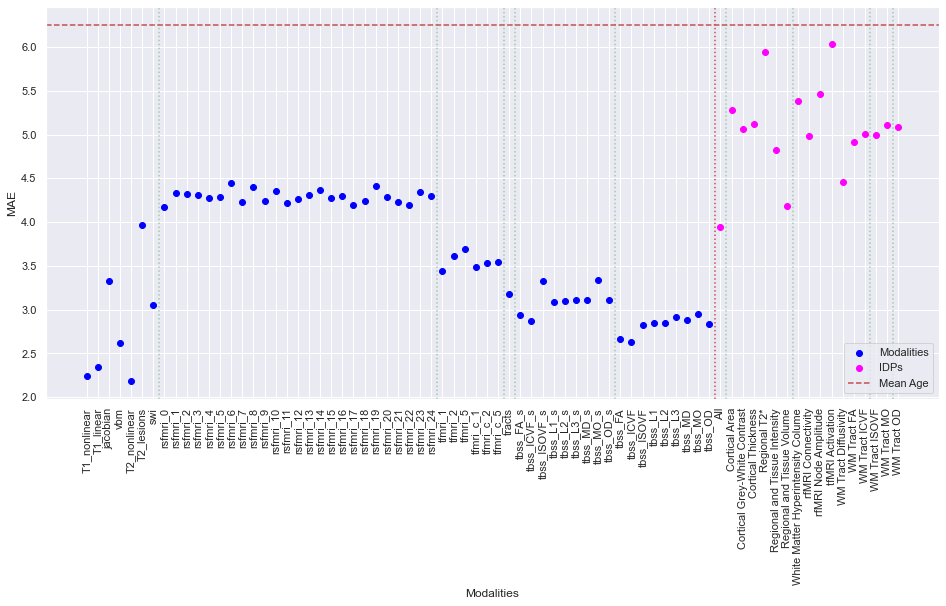

In [74]:
# df_test = {}
MAEsIDP = []
namesIDPs = df.modality.to_list()
for idx in range(len(df)):
    data = df.iloc[idx].dataframe.mean_age_delta.to_list()
    MAEsIDP.append(np.abs(np.array(data)).mean())
    
MAEsNN = []
namesNN = dfNN.modality.to_list()
for idx in range(len(dfNN)):
    data = dfNN.iloc[idx].dataframe.mean_age_delta.to_list()
    MAEsNN.append(np.abs(np.array(data)).mean())
    
# df_test = pd.DataFrame.from_dict(df_test)

MAEs = MAEsNN + MAEsIDP
names = namesNN + namesIDPs

MAEsIDP = np.array(MAEsIDP)
MAEsNN = np.array(MAEsNN)

namesIDPs = np.array(namesIDPs)
namesNN = np.array(namesNN)

MAEs = np.array(MAEs)
names = np.array(names)

col =[]

for i in range(0, len(MAEs)):
    if i<=len(MAEsNN):
        col.append('blue')  
    else:
        col.append('magenta') 

fig = plt.figure(figsize=(16, 7.2))

plt.scatter(np.arange(1, MAEsNN.shape[0]+1), MAEsNN, c='blue', label='Modalities')
plt.scatter(np.arange(MAEsNN.shape[0]+1, MAEsNN.shape[0]+MAEsIDP.shape[0]+1), MAEsIDP, c='magenta', label='IDPs')
plt.xticks(np.arange(1, MAEs.shape[0]+1), names, rotation=90);

plt.xlabel("Modalities")
plt.ylabel("MAE")
plt.axvline(x=7.5, color='g', linestyle='dotted', alpha=0.5);
plt.axvline(x=32.5, color='g', linestyle='dotted', alpha=0.5);
plt.axvline(x=38.5, color='g', linestyle='dotted', alpha=0.5);
plt.axvline(x=39.5, color='g', linestyle='dotted', alpha=0.5);
plt.axvline(x=48.5, color='g', linestyle='dotted', alpha=0.5);
plt.axhline(y=6.253, color='r', linestyle='dashed', label='Mean Age')
plt.axvline(x=57.5, color='r', linestyle='dotted');
plt.axvline(x=58.5, color='g', linestyle='dotted', alpha=0.5);
plt.axvline(x=64.5, color='g', linestyle='dotted', alpha=0.5);
plt.axvline(x=71.5, color='g', linestyle='dotted', alpha=0.5);
plt.axvline(x=73.5, color='g', linestyle='dotted', alpha=0.5);

plt.legend(loc=4)

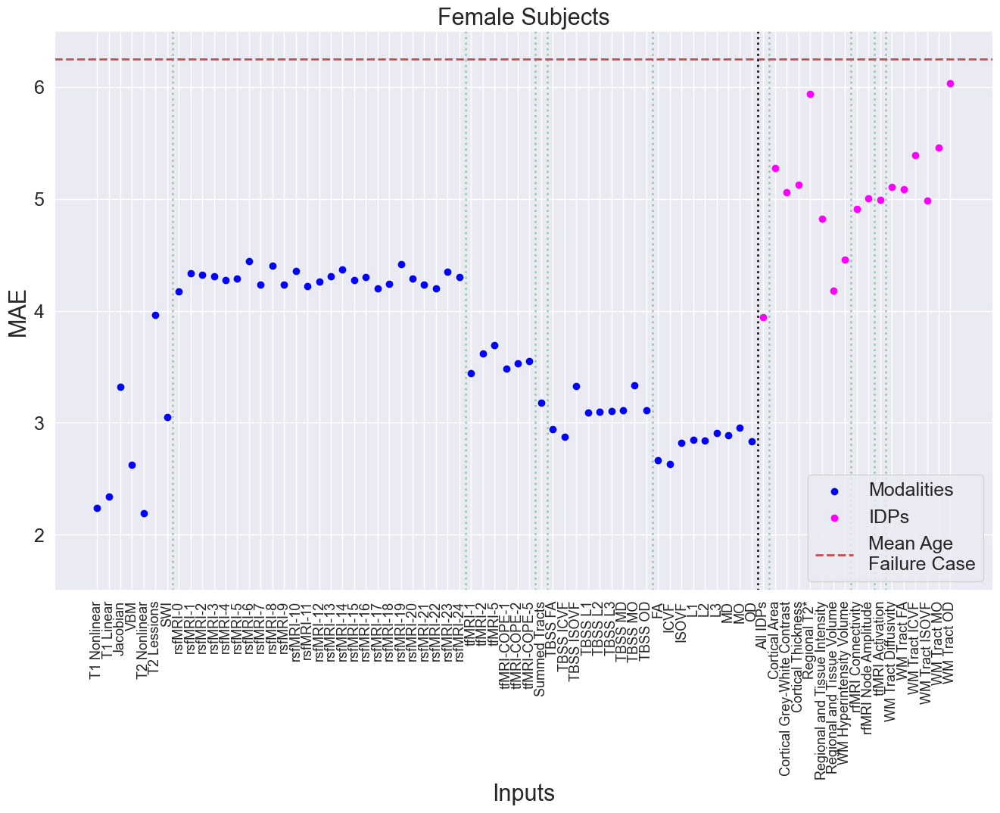

In [52]:
# df_test = {}
MAEsIDP = []
# namesIDPs = df.modality.to_list()
namesIDPs = ['All IDPs', 'Cortical Area', 'Cortical Grey-White Contrast',
       'Cortical Thickness', 'Regional T2*',
       'Regional and Tissue Intensity', 'Regional and Tissue Volume',
        'WM Hyperintensity Volume', 'rfMRI Connectivity',
       'rfMRI Node Amplitude', 'tfMRI Activation',
       'WM Tract Diffusivity', 'WM Tract FA', 'WM Tract ICVF',
       'WM Tract ISOVF', 'WM Tract MO', 'WM Tract OD',
        ]
for idx in range(len(df)):
    data = df.iloc[idx].dataframe.mean_age_delta.to_list()
    MAEsIDP.append(np.abs(np.array(data)).mean())
    
MAEsNN = []
# namesNN = dfNN.modality.to_list()
namesNN = [
    'T1 Nonlinear', 'T1 Linear', 'Jacobian', 'VBM', 'T2 Nonlinear', 'T2 Lessions', 'SWI', 'rsfMRI-0', 'rsfMRI-1',
    'rsfMRI-2', 'rsfMRI-3', 'rsfMRI-4', 'rsfMRI-5', 'rsfMRI-6', 'rsfMRI-7', 'rsfMRI-8', 'rsfMRI-9', 'rsfMRI-10', 
    'rsfMRI-11', 'rsfMRI-12', 'rsfMRI-13', 'rsfMRI-14', 'rsfMRI-15', 'rsfMRI-16', 'rsfMRI-17', 'rsfMRI-18', 'rsfMRI-19',
    'rsfMRI-20', 'rsfMRI-21', 'rsfMRI-22', 'rsfMRI-23', 'rsfMRI-24', 'tfMRI-1', 'tfMRI-2', 'tfMRI-5', 'tfMRI-COPE-1',
    'tfMRI-COPE-2', 'tfMRI-COPE-5', 'Summed Tracts', 'TBSS FA', 'TBSS ICVF', 'TBSS ISOVF', 'TBSS L1', 'TBSS L2',
    'TBSS L3', 'TBSS MD', 'TBSS MO', 'TBSS OD', 'FA', 'ICVF', 'ISOVF', 'L1', 'L2', 'L3', 'MD', 'MO', 'OD'
]
for idx in range(len(dfNN)):
    data = dfNN.iloc[idx].dataframe.mean_age_delta.to_list()
    MAEsNN.append(np.abs(np.array(data)).mean())
    
# df_test = pd.DataFrame.from_dict(df_test)

MAEs = MAEsNN + MAEsIDP
names = namesNN + namesIDPs

MAEsIDP = np.array(MAEsIDP)
MAEsNN = np.array(MAEsNN)

namesIDPs = np.array(namesIDPs)
namesNN = np.array(namesNN)

MAEs = np.array(MAEs)
names = np.array(names)

col =[]

for i in range(0, len(MAEs)):
    if i<=len(MAEsNN):
        col.append('blue')  
    else:
        col.append('magenta') 
        
title_font_size=22
ticks_font_size=18
legend_font = 18
figsize=(16, 9.6)

fig = plt.figure(figsize=figsize)

plt.scatter(np.arange(1, MAEsNN.shape[0]+1), MAEsNN, c='blue', label='Modalities')
plt.scatter(np.arange(MAEsNN.shape[0]+1, MAEsNN.shape[0]+MAEsIDP.shape[0]+1), MAEsIDP, c='magenta', label='IDPs')
plt.xticks(np.arange(1, MAEs.shape[0]+1), names, rotation=90,fontsize= ticks_font_size-5 );
plt.yticks(fontsize= ticks_font_size)
plt.xlabel("Inputs", fontsize=title_font_size)
plt.ylabel("MAE", fontsize=title_font_size)
plt.axvline(x=7.5, color='g', linestyle='dotted', alpha=0.5, linewidth=2);
plt.axvline(x=32.5, color='g', linestyle='dotted', alpha=0.5, linewidth=2);
plt.axvline(x=38.5, color='g', linestyle='dotted', alpha=0.5, linewidth=2);
plt.axvline(x=39.5, color='g', linestyle='dotted', alpha=0.5, linewidth=2);
plt.axvline(x=48.5, color='g', linestyle='dotted', alpha=0.5, linewidth=2);
plt.axhline(y=6.253, color='r', linestyle='dashed', label='Mean Age\nFailure Case', linewidth=2)
plt.axvline(x=57.5, color='k', linestyle='dotted', linewidth=2);
plt.axvline(x=58.5, color='g', linestyle='dotted', alpha=0.5, linewidth=2);
plt.axvline(x=65.5, color='g', linestyle='dotted', alpha=0.5, linewidth=2);
plt.axvline(x=67.5, color='g', linestyle='dotted', alpha=0.5, linewidth=2);
plt.axvline(x=68.5, color='g', linestyle='dotted', alpha=0.5, linewidth=2);

plt.legend(loc=4, fontsize=legend_font)

plt.ylim([1.5, 6.5])
plt.title('Female Subjects', fontsize=title_font_size)

fig.savefig('Female_MAE_predictions.png', bbox_inches='tight')

In [53]:
vars_dfNN = pd.read_pickle('female_vars_testB.pkl')

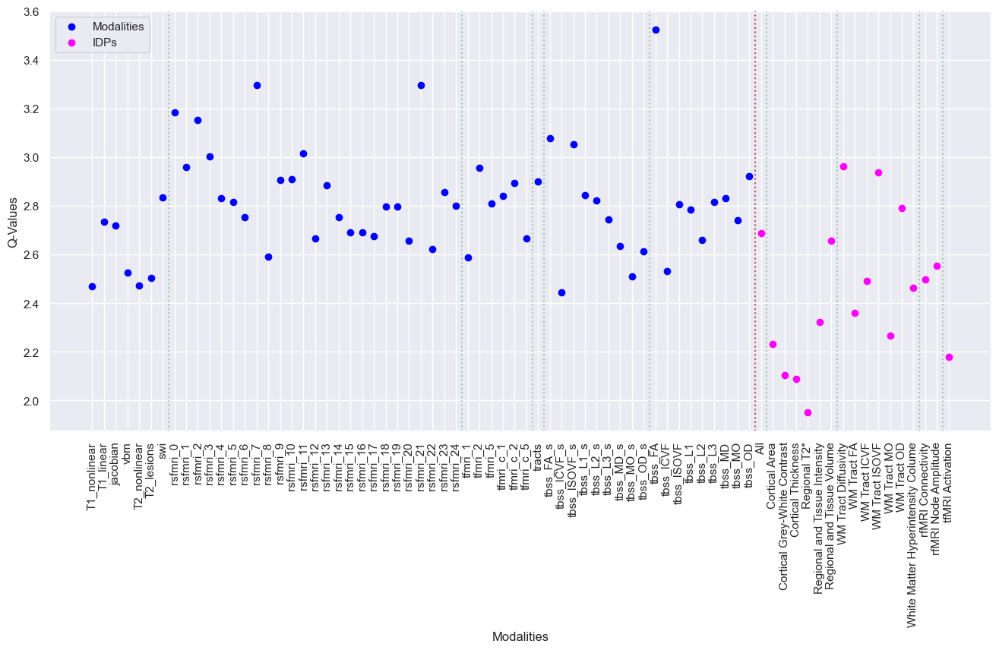

In [54]:
QsIDP = df.Qs.to_list()
namesIDPs = df.modality.to_list()
  
QsNN = []
namesNN = vars_dfNN.modality.to_list()
for idx in range(len(vars_dfNN)):
    data = vars_dfNN.iloc[idx].dataframe.log_p_values.to_list()
    QsNN.append(np.percentile(data, 99))

Qs = list(MAEsNN) + list(MAEsIDP)
names = namesNN + namesIDPs

QsIDP = np.array(QsIDP)
QsNN = np.array(QsNN)

namesIDPs = np.array(namesIDPs)
namesNN = np.array(namesNN)

Qs = np.array(Qs)
names = np.array(names)

fig = plt.figure(figsize=(16, 7.2))

plt.scatter(np.arange(1, QsNN.shape[0]+1), QsNN, c='blue', label='Modalities')
plt.scatter(np.arange(QsNN.shape[0]+1, QsNN.shape[0]+QsIDP.shape[0]+1), QsIDP, c='magenta', label='IDPs')
plt.xticks(np.arange(1, Qs.shape[0]+1), names, rotation=90);

plt.xlabel("Modalities")
plt.ylabel("Q-Values")
plt.axvline(x=7.5, color='g', linestyle='dotted', alpha=0.5);
plt.axvline(x=32.5, color='g', linestyle='dotted', alpha=0.5);
plt.axvline(x=38.5, color='g', linestyle='dotted', alpha=0.5);
plt.axvline(x=39.5, color='g', linestyle='dotted', alpha=0.5);
plt.axvline(x=48.5, color='g', linestyle='dotted', alpha=0.5);
plt.axvline(x=57.5, color='r', linestyle='dotted');
plt.axvline(x=58.5, color='g', linestyle='dotted', alpha=0.5);
plt.axvline(x=64.5, color='g', linestyle='dotted', alpha=0.5);
plt.axvline(x=71.5, color='g', linestyle='dotted', alpha=0.5);
plt.axvline(x=73.5, color='g', linestyle='dotted', alpha=0.5);

# plt.legend(loc=4)
plt.legend()

Show coef for ALL from EN maybe scatter plot
Report what individal IDPs mean withing each category

In [57]:
vars_dfNN = pd.read_pickle('female_vars_testB.pkl')
vars_df = pd.read_pickle('IDP_predictions_female_vars_testsetB.pkl')
vars_df.iloc[0].dataframe.head()

,idx,names,Categories,pearson_r,t_test_statistic,p_values_corrected,p_values,abs_pearson_r,log_p_values,log_p_values_corrected
0,0,Ethnic background (0.0),Ethnic Background,-0.005259,0.262406,1.000000,0.793030,0.005259,0.100710,-0.000000
1,1,Ethnic background (1.0),Ethnic Background,0.027365,0.565675,1.000000,0.571912,0.027365,0.242671,-0.000000
2,2,Ethnic background (2.0),Ethnic Background,-0.020342,0.544432,1.000000,0.586314,0.020342,0.231870,-0.000000
3,3,Genotype measurement batch (0.0),Genetic Markers,-0.055751,2.755931,0.365796,0.005896,0.055751,2.229435,0.436761
4,4,Heterozygosity (0.0),Genetic Markers,0.003638,0.179565,1.000000,0.857509,0.003638,0.066761,-0.000000


In [58]:
def bland_altman_plot(df, modality, metric, heatmap=False, bonf=None, fdr=None):
    if metric == '-log(P)':
        colData1 = 'log_p_values_x'
        colData2 = 'log_p_values_y'
    elif metric == 'Pearson R':
        colData1 = 'pearson_r_x'
        colData2 = 'pearson_r_y'
    elif metric == 'Pearson R Abs':
        colData1 = 'abs_pearson_r_x'
        colData2 = 'abs_pearson_r_y'
    else:
        return
    data1     = df[colData1].to_numpy()
    data2     = df[colData2].to_numpy()
    mean      = np.mean([data1, data2], axis=0)
    diff      = data1 - data2                   # Difference between data1 and data2
    md        = np.mean(diff)                   # Mean of the difference
    sd        = np.std(diff, axis=0)            # Standard deviation of the difference
    CI_low    = md - 1.96*sd
    CI_high   = md + 1.96*sd
    CI_perc = len(np.where((diff>=CI_low) & (diff <= CI_high))[0]) / len(diff)
    CI_perc = round(CI_perc, 3) * 100

    plt.figure(figsize=(9.6, 7.2))
    
    if heatmap == False:
        colorCycle=['#000000', '#00CED1','#008080','#ffdf00','#9cded6','#8e063b','#DAACD5','#ff7f00','#8595e1','#e31a1c','#fb9a99','#0a5d00','#1fc600','#000080','#1f78b4','#a6cee3', '#023fa5', '#e07b91', '#50301e']
        sns.scatterplot(data=df, x=mean, y=diff, hue='Categories_x', palette=colorCycle)
    else:
        sns.set_style("darkgrid", {'image.cmap': u'plasma'})
        x = mean
        y = diff
        xy = np.vstack((x,y))
        z = gaussian_kde(xy)
        z = z.evaluate(xy)

        idx = z.argsort()
        x, y, z = x[idx], y[idx], z[idx]
        plt.scatter(x,y,c=z)
        
    plt.axhline(md,           color='gray', linestyle='--', alpha=0.5)
    plt.axhline(md + 1.96*sd, color='gray', linestyle='--', alpha=0.5)
    plt.axhline(md - 1.96*sd, color='gray', linestyle='--', alpha=0.5)
    if bonf is not None:
        plt.axvline(bonf, color='red', linestyle='--', alpha=0.5)
        plt.text(x=bonf, y=min(diff), s='Bonf.')
    if fdr is not None:
        plt.axvline(fdr, color='red', linestyle='--', alpha=0.5)
        plt.text(x=fdr, y=min(diff), s='FDR.')
    
    xOutPlot = np.min(mean) + (np.max(mean)-np.min(mean))*1.14
    
    plt.text(xOutPlot, md - 1.96*sd, 
        r'-1.96SD:' + "\n" + "%.2f" % CI_low, 
        ha = "center",
        va = "center",
        )
    plt.text(xOutPlot, md + 1.96*sd, 
        r'+1.96SD:' + "\n" + "%.2f" % CI_high, 
        ha = "center",
        va = "center",
        )
    plt.text(xOutPlot, md, 
        r'Mean:' + "\n" + "%.2f" % md, 
        ha = "center",
        va = "center",
        )
    
    title = 'Bland-Altman Plot: ' + modality
    xlabel = metric + ' Means'
    ylabel = metric + ' Differences'
    
    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    plt.title(title)
    
    if heatmap==False:
        plt.plot([],[],' ',label= str(CI_perc) + '%')
        plt.legend(bbox_to_anchor=(1.21, 1), loc=2, borderaxespad=0.)
    
    
def scatter_plot_heatmap(x, y, xlabel, ylabel, title, equality_line=True, set_scale=False):
    
    x = x.to_numpy()
    y = y.to_numpy()
    
    fig = plt.figure(figsize=[7.2, 7.2])
    sns.set_style("darkgrid", {'image.cmap': u'plasma'})
    xy = np.vstack([x,y])
    z = gaussian_kde(xy)(xy)
    # Sort the points by density, so that the densest points are plotted last
    idx = z.argsort()
    x, y, z = x[idx], y[idx], z[idx]
    plt.scatter(x,y,c=z,s=50)
    if equality_line == True:
        plt.plot(x, x, ls="-", color = sns.xkcd_rgb['black'], label='Equality Line') #this is just the line of equality
    
    X_mat=np.vstack((np.ones(len(x)), x)).T
    beta_hat = np.linalg.inv(X_mat.T.dot(X_mat)).dot(X_mat.T).dot(y)
    b,w = beta_hat[0],beta_hat[1]
    x2 = np.linspace(np.min(x),np.max(x),num=10)
    y2 = w * x2 + b
    plt.plot(x2,y2,ls='--', color= sns.xkcd_rgb['red'], label='Linear Regression Line')
    
    pearson_correlation = pearsonr(x,y)[0]
#     plt.text(np.max(x), np.min(y)+0.05*np.abs(np.min(y2)), 'R='+str(round(pearson_correlation,3)), horizontalalignment='right', fontsize='large')

In [76]:
# set1 = ['All',
#  'Cortical Area',
#  'Cortical Grey-White Contrast',
#  'Cortical Thickness',
#  'Regional T2*',
#  'Regional and Tissue Intensity',
#  'Regional and Tissue Volume',]
# set1NN = ['T1_nonlinear',
#  'T1_linear',
#  'jacobian',
#  'vbm',
#  'T2_nonlinear',
#  'T2_lesions',
#  'swi',]

# set2 = ['All',
#        'WM Tract Diffusivity',
#  'WM Tract FA',
#  'WM Tract ICVF',
#  'WM Tract ISOVF',
#  'WM Tract MO',
#  'WM Tract OD',
# 'White Matter Hyperintensity Colume',
#        ]
# set2NN = ['tracts',
#  'tbss_FA_s',
#  'tbss_ICVF_s',
#  'tbss_ISOVF_s',
#  'tbss_L1_s',
#  'tbss_L2_s',
#  'tbss_L3_s',
#  'tbss_MD_s',
#  'tbss_MO_s',
#  'tbss_OD_s',
#  'tbss_FA',
#  'tbss_ICVF',
#  'tbss_ISOVF',
#  'tbss_L1',
#  'tbss_L2',
#  'tbss_L3',
#  'tbss_MD',
#  'tbss_MO',
#  'tbss_OD']

# set3 = ['All','rfMRI Connectivity',
#  'rfMRI Node Amplitude',
#        ]
# set3NN = [
#     'rsfmri_0',
#  'rsfmri_1',
#  'rsfmri_2',
#  'rsfmri_3',
#  'rsfmri_4',
#  'rsfmri_5',
#  'rsfmri_6',
#  'rsfmri_7',
#  'rsfmri_8',
#  'rsfmri_9',
#  'rsfmri_10',
#  'rsfmri_11',
#  'rsfmri_12',
#  'rsfmri_13',
#  'rsfmri_14',
#  'rsfmri_15',
#  'rsfmri_16',
#  'rsfmri_17',
#  'rsfmri_18',
#  'rsfmri_19',
#  'rsfmri_20',
#  'rsfmri_21',
#  'rsfmri_22',
#  'rsfmri_23',
# 'rsfmri_24'
# ]

# set4 = ['tfmri_1',
#  'tfmri_2',
#  'tfmri_5',
#  'tfmri_c_1',
#  'tfmri_c_2',
#  'tfmri_c_5',]

# for idxA in range(len(vars_dfNN)):
#     dfA = vars_dfNN.iloc[idxA].dataframe
#     modalityA = vars_dfNN.iloc[idxA].modality
#     for idxB in range(len(vars_df)):
#         dfB = vars_df.iloc[idxB].dataframe
#         modalityB = vars_df.iloc[idxB].modality
#         modality = modalityA + '-' + modalityB
#         dfm = pd.merge(dfA, dfB, on='idx', how='inner')
#     #     bonf = (vars_df_A.iloc[idx].bonf + vars_df_B.iloc[idx].bonf) / 2
#     #     fdr = (vars_df_A.iloc[idx].fdr + vars_df_B.iloc[idx].fdr) / 2
#         bland_altman_plot(dfm.sort_values('Categories_x'), modality = modality, metric='-log(P)',
#     #                      bonf=bonf, fdr=fdr
#                          )

In [3]:
df = pd.read_pickle('IDP_predictions_female_testsetB.pkl')

In [4]:
df

,modality,SVD J,MAEs,PRs,MAEs_debiased,PRs_debiased,Qs,coefficients,intercept,alphas,l1_ratios,dataframe,idx_nans_test
0,All,1000,3.944172,0.736224,5.312553,0.736224,2.687405,"[-294.35993525380024, 21.133151582876717, -175...",-1.627664e-02,0.000366,1.00,Unnamed: 0 mean_output_age mean_age_de...,"[61, 182, 231, 431, 432, 455, 1092, 1102, 1350..."
1,Cortical Area,0,5.277573,0.451202,11.447095,0.451202,2.231115,"[0.0, 0.3643615923027196, 0.07957667223237505,...",-1.356477e-02,0.007275,0.50,Unnamed: 0 mean_output_age mean_age_de...,"[61, 231, 431, 432, 455, 1092, 1102, 1350, 153..."
2,Cortical Grey-White Contrast,70,5.062944,0.512828,9.730955,0.512828,2.103351,"[-248.4516622125567, -145.35642106143985, -133...",-1.168070e-02,0.000135,0.99,Unnamed: 0 mean_output_age mean_age_de...,"[61, 432, 1102, 1350, 1530, 1689, 1706, 2307]"
3,Cortical Thickness,306,5.126076,0.497889,10.074157,0.497889,2.089231,"[-152.66021736067128, 9.007920912286798, -1.97...",-1.356477e-02,0.000301,0.99,Unnamed: 0 mean_output_age mean_age_de...,"[61, 231, 431, 432, 455, 1092, 1102, 1350, 153..."
4,Regional T2*,0,5.939897,0.193570,29.111454,0.193570,1.950930,"[0.8183900055855015, 0.6534309717935721, 0.352...",-2.691982e-03,0.016240,0.10,Unnamed: 0 mean_output_age mean_age_de...,[182]
5,Regional and Tissue Intensity,0,4.823697,0.569063,8.351785,0.569063,2.323200,"[-2.0261140100008066, 0.5722035732571632, -0.3...",-1.168088e-02,0.014730,0.70,Unnamed: 0 mean_output_age mean_age_de...,"[61, 432, 1102, 1350, 1530, 1689, 1706, 2307]"
6,Regional and Tissue Volume,647,4.181287,0.700952,5.813769,0.700952,2.657055,"[-307.9613739584205, 45.169492671126136, 57.40...",-1.356477e-02,0.000209,0.99,Unnamed: 0 mean_output_age mean_age_de...,"[61, 231, 431, 432, 455, 1092, 1102, 1350, 153..."
7,WM Tract Diffusivity,300,4.456986,0.645759,6.859344,0.645759,2.961247,"[-224.09443402212514, -69.99444998126756, -157...",-4.063847e-15,0.000319,1.00,Unnamed: 0 mean_output_age mean_age_de...,[]
8,WM Tract FA,0,4.911317,0.551500,8.815608,0.551500,2.361297,"[-0.8562524495633267, 0.33826926638971205, -0....",-4.172178e-15,0.023452,0.10,Unnamed: 0 mean_output_age mean_age_de...,[]
9,WM Tract ICVF,0,5.005793,0.524019,9.414861,0.524019,2.492155,"[-0.45081813784488817, 0.45960283156490345, -1...",-4.076846e-15,0.006581,0.50,Unnamed: 0 mean_output_age mean_age_de...,[]


In [ ]:
df = pd.read_pickle('IDP_predictions_female_testsetB.pkl')

df = df.reindex([
    0, 1, 2, 3, 4, 5, 6, 13, 14, 15, 16, 7, 8, 9, 10, 11, 12
])

modality_names = ['All IDPs', 'Cortical Area', 'Cortical Grey-White Contrast',
       'Cortical Thickness', 'Regional T2*',
       'Regional and Tissue Intensity', 'Regional and Tissue Volume',
                  'WM Hyperintensity Volume', 'rfMRI Connectivity',
       'rfMRI Node Amplitude', 'tfMRI Activation',
       'WM Tract Diffusivity', 'WM Tract FA', 'WM Tract ICVF',
       'WM Tract ISOVF', 'WM Tract MO', 'WM Tract OD',
        ]
title_font_size=22
ticks_font_size=16
legend_font = 18
figsize=(20, 20)

# confounds_file = '../Desktop/agemapper/Analsysis Female New/female_testB_conf12.h5'
confounds_file = 'female_testB_conf12.h5'
confounds = h5py.File(confounds_file, 'r')
confounds = confounds['conf12'][()]

# correlation_plot(df, key='age_delta_decon', title='Age Delta Debiased', 
#                  partial_correlation=False, fig_size=20)


def deconfound_inputs2(y, confounds):
    
    y = y - y.mean(axis=0)
    if np.sum(np.isnan(y)) == 0:
        beta = np.linalg.pinv(confounds).dot(y)
        beta[np.abs(beta) < 1e-10] = 0
        yd = y - confounds.dot(beta)
        yd = yd - yd.mean()
    else:
        print('ERROR! Encoundered a NaN! Function Needs Updating!')
    
    return yd

def correlation_plot_fig(df, key, title, partial_correlation= False, fix_colorbar_scale=False,
                    use_B_testset = False, modality_names=None,
                    title_font_size = None,
                    ticks_font_size = None,
                    legend_font = None,
                    figsize = None,
                        deconfound=False,
                        confounds = None,
                     save_fig_title=None,
                    ):    
    
    
    names = modality_names
    fig_size = figsize
    
    if partial_correlation == False:
        
        if deconfound == True:
            for idx in range(len(df)):
                df1 = df.iloc[idx].dataframe
                if idx == 0:
                    listOfCommonSubjects = df1['Unnamed: 0'].to_numpy()
                else:
                    if len(listOfCommonSubjects) > df1['Unnamed: 0'].to_numpy().shape[0]:
                        listOfCommonSubjects = df1['Unnamed: 0'].to_numpy()
            
            listOfCommonSubjects = list(listOfCommonSubjects)
            df1 = df.iloc[-1].dataframe
            elimSubj = list(set(df1['Unnamed: 0']) - set(listOfCommonSubjects))
            idx_elim = np.intersect1d(df1['Unnamed: 0'], elimSubj, return_indices=True)[1]
            counfoundsMerged = np.delete(confounds, idx_elim, axis=0)

            corr_df1= []
            for idx1 in range(len(df)):
                df1 = df.iloc[idx1].dataframe
                elimSubj1 = list(set(df1['Unnamed: 0']) - set(listOfCommonSubjects))
                idx_elim1 = np.intersect1d(df1['Unnamed: 0'], elimSubj1, return_indices=True)[1]
                data1 = df1[key].to_numpy()
                data1 = np.delete(data1, idx_elim1, axis=0)
                data1 = deconfound_inputs2(data1, counfoundsMerged)
                corr_df2 = []
                for idx2 in range(len(df)):
                    df2 = df.iloc[idx2].dataframe
                    elimSubj2 = list(set(df2['Unnamed: 0']) - set(listOfCommonSubjects))
                    idx_elim2 = np.intersect1d(df2['Unnamed: 0'], elimSubj2, return_indices=True)[1]
                    data2 = df2[key].to_numpy()
                    data2 = np.delete(data2, idx_elim2, axis=0)
                    data2 = deconfound_inputs2(data2, counfoundsMerged)
                    r, _ = pearsonr(data1, data2)
                    corr_df2.append(r)
                corr_df2 = np.array(corr_df2).astype('float32')
                corr_df1.append(corr_df2)
            corr_df1 = np.array(corr_df1).astype('float32')

            title = title + '\nand Deconfounded'

        else:

            corr_df1 = []
            for idx1 in range(len(df)):
                df1 = df.iloc[idx1].dataframe
                corr_df2 = []
                for idx2 in range(len(df)):
                    df2 = df.iloc[idx2].dataframe
                    
                    dfm = pd.merge(df1, df2, on='Unnamed: 0', how='inner')
                    keyX = key + '_x'
                    keyY = key + '_y'
                    r, _ = pearsonr(dfm[keyX], dfm[keyY])
                    
                    corr_df2.append(r)
                corr_df2 = np.array(corr_df2).astype('float32')
                corr_df1.append(corr_df2)
            corr_df1 = np.array(corr_df1).astype('float32')
        
        get_corr_plot(corr_df1, labels=names, partial_correlation=partial_correlation,
                      title=title, fig_size=fig_size, fix_colorbar_scale=fix_colorbar_scale,
                     title_font_size = title_font_size,
                    ticks_font_size = ticks_font_size,
                    legend_font = legend_font,
                      save_fig_title=save_fig_title
                     )
        
    else:
        tmp_dct = {}
        if deconfound == True:
            for idx in range(len(df)):
                df1 = df.iloc[idx].dataframe
                if idx == 0:
                    listOfCommonSubjects = df1['Unnamed: 0'].to_numpy()
                else:
                    if len(listOfCommonSubjects) > df1['Unnamed: 0'].to_numpy().shape[0]:
                        listOfCommonSubjects = df1['Unnamed: 0'].to_numpy()
            
            listOfCommonSubjects = list(listOfCommonSubjects)
            df1 = df.iloc[-1].dataframe
            elimSubj = list(set(df1['Unnamed: 0']) - set(listOfCommonSubjects))
            idx_elim = np.intersect1d(df1['Unnamed: 0'], elimSubj, return_indices=True)[1]
            counfoundsMerged = np.delete(confounds, idx_elim, axis=0)

            computation_matrix = []
            for idx in range(len(df)):
                df1 = df.iloc[idx].dataframe
                elimSubj = list(set(df1['Unnamed: 0']) - set(listOfCommonSubjects))
                idx_elim = np.intersect1d(df1['Unnamed: 0'], elimSubj, return_indices=True)[1]
                data1 = df1[key].to_numpy()
                data1 = np.delete(data1, idx_elim, axis=0)
                data1 = deconfound_inputs2(data1, counfoundsMerged)
                computation_matrix.append(data1.tolist()) 
            computation_matrix = np.array(computation_matrix).T
    
            title = title + '\nand Deconfounded'
            for idx in range(computation_matrix.shape[1]):
                tmp_dct[names[idx]] = computation_matrix[:, idx]
            pcorr_df = pd.DataFrame.from_dict(tmp_dct)
            del tmp_dct
        else:
            for idx in range(len(df)):
#                 tmp_df = df.iloc[idx].dataframe[key]
                tmp_df = pd.merge(df.iloc[0].dataframe, df.iloc[idx].dataframe, on='Unnamed: 0', how='inner')
                keyY = key + '_y'
                tmp_df = tmp_df[keyY]
                tmp_dct[names[idx]] = tmp_df.to_numpy()
            pcorr_df = pd.DataFrame.from_dict(tmp_dct)
            del tmp_dct, tmp_df
        
        # This implementation comes from https://pingouin-stats.org/index.html
        # Source code here for pcorr: https://github.com/raphaelvallat/pingouin/blob/72e447d539f8cfbd6b9c9c5041e267de748fe124/pingouin/correlation.py

        V = pcorr_df.cov()
        Vi = np.linalg.pinv(V, hermitian=True)
        D = np.diag(np.sqrt(1 / np.diag(Vi)))
        pcor = -1 * (D @ Vi @ D)
        pcor[np.diag_indices_from(pcor)] = 1
        get_corr_plot(pcor, labels=names, partial_correlation=partial_correlation,
                      title=title, fig_size=fig_size, fix_colorbar_scale=fix_colorbar_scale,
                     title_font_size = title_font_size,
                    ticks_font_size = ticks_font_size,
                    legend_font = legend_font,
                      save_fig_title= save_fig_title,
                     )

_ = correlation_plot_fig(df, key='age_delta_decon', title="Female Subjects' Predicted Age Deltas Debiased", 
                 partial_correlation=False, use_B_testset= True, modality_names=modality_names,
                           title_font_size=title_font_size,
                            ticks_font_size=ticks_font_size,
                            legend_font = legend_font,
                            figsize=figsize,
                            confounds=confounds,
                            deconfound=True,
                            save_fig_title='Female_Correlation_Matrix_IDPs_DECONFOUNDED.png'
                          )

_ = correlation_plot_fig(df, key='age_delta_decon', title="Female Subjects' Predicted Age Deltas Debiased", 
                 partial_correlation=True, use_B_testset= True, modality_names=modality_names,
                           title_font_size=title_font_size,
                            ticks_font_size=ticks_font_size,
                            legend_font = legend_font,
                            figsize=figsize,
                            confounds=confounds,
                            deconfound=True,
                            save_fig_title='Female_PartialCorrelation_Matrix_IDPs_DECONFOUNDED.png'
                          )